In [ ]:
!pip install dotenv

## 1️⃣ Dataset Setup (PROVIDED)

The Edge2Shoes dataset has been downloaded and prepared for you. The dataset structure is as follows:
- `train/` folder contains training images
- `val/` folder contains validation images
- Each image contains edge sketch (left half) and corresponding shoe (right half)


In [ ]:
import kagglehub                  # To download and locate the Kaggle dataset
import os                         # To interact with the operating system
from dotenv import load_dotenv    # To load environment variables

# Dataset already downloaded and prepared
load_dotenv()
path = kagglehub.dataset_download("balraj98/edges2shoes-dataset")
print("Path to dataset files:", path)

# Create training and validation subfolders withi the dataset
train_dir = os.path.join(path, 'train')
val_dir = os.path.join(path, 'val')

# Verify directories exist
if not os.path.exists(train_dir):
    raise FileNotFoundError(f"Training directory not found: {train_dir}. Ensure dataset downloaded correctly.")
if not os.path.exists(val_dir):
    raise FileNotFoundError(f"Validation directory not found: {val_dir}. Ensure dataset downloaded correctly.")

print(f"Training directory: {train_dir}")
print(f"Validation directory: {val_dir}")


Path to dataset files: /kaggle/input/edges2shoes-dataset
Training directory: /kaggle/input/edges2shoes-dataset/train
Validation directory: /kaggle/input/edges2shoes-dataset/val


## 2️⃣ Import Libraries and Configuration

**Task**: Import all necessary libraries and set up configuration parameters.

**Requirements**:
- Import PyTorch, torchvision, and related libraries
- Import matplotlib, PIL, numpy, and other utilities
- Set random seeds for reproducibility
- Configure hyperparameters with reasonable values

In [ ]:
# Import libraries
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader # PyTorch utilities for handling datasets
import torchvision.transforms as transforms      # Common image transformations
from torchvision.utils import save_image, make_grid
from PIL import Image                            # Python Imaging Library for opening images
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
from PIL import Image, ImageEnhance, ImageFilter
import time
import glob
import torchvision.models as models               # For VGG19 in perceptual loss
import random
from tqdm import tqdm  # progress bar for training
from torch.optim.lr_scheduler import CosineAnnealingLR # For learning rate scheduling

# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(42) # Also set seed for GPU if available

# Check if a CUDA-enabled GPU is available, otherwise default to CPU
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# Configuration parameters
IMG_SIZE = 128
BATCH_SIZE = 32
LEARNING_RATE = 2e-4
BETA1 = 0.5
BETA2 = 0.999
LAMBDA_L1 = 100
LAMBDA_PERCEPTUAL = 10
NUM_EPOCHS = 30

# Data augmentation settings
AUGMENTATION_CONFIG = {
    'enabled': False,
    'probability': 0.7,
    'rotation_range': 15,
    'scale_range': (0.85, 1.15),
    'flip_probability': 0.5,
    'brightness_range': (0.8, 1.2)
}


print(f"Configuration:")
print(f"Image Size: {IMG_SIZE}")
print(f"Batch Size: {BATCH_SIZE}")
print(f"Learning Rate: {LEARNING_RATE}")
print(f"L1 Lambda: {LAMBDA_L1}")
print(f"Epochs: {NUM_EPOCHS}")
print(f"Augmentation: {'Enabled' if AUGMENTATION_CONFIG['enabled'] else 'Disabled'}")



Using device: cuda
Configuration:
Image Size: 128
Batch Size: 32
Learning Rate: 0.0002
L1 Lambda: 100
Epochs: 30
Augmentation: Disabled


## 3️⃣ Custom Dataset Class

**Task**: Create a custom dataset class that handles the Edge2Shoes data format.

**Requirements**:
- Split each image into left half (edge) and right half (shoe)
- Apply transformations to both images
- Return edge image as input and shoe image as target


In [ ]:
# DATA AUGMENTATION CLASSES

class PairedAugmentation:
    """
    Augmentation class that applies the same geometric transformations
    to both edge and shoe images to maintain correspondence
    """

    def __init__(self,
                 rotation_range=15,
                 scale_range=(0.85, 1.15),
                 brightness_range=(0.8, 1.2),
                 contrast_range=(0.8, 1.2),
                 flip_prob=0.5,
                 noise_prob=0.3):

        self.rotation_range = rotation_range
        self.scale_range = scale_range
        self.brightness_range = brightness_range
        self.contrast_range = contrast_range
        self.flip_prob = flip_prob
        self.noise_prob = noise_prob

    def __call__(self, edge_img, shoe_img):
        """Apply paired augmentations to both images"""

        # 1. GEOMETRIC TRANSFORMATIONS (apply to both images identically)

        # Random rotation
        if random.random() < 0.5:
            angle = random.uniform(-self.rotation_range, self.rotation_range)
            edge_img = edge_img.rotate(angle, fillcolor=255)  # White fill for edges
            shoe_img = shoe_img.rotate(angle, fillcolor=255)

        # Random scaling
        if random.random() < 0.5:
            scale = random.uniform(*self.scale_range)
            original_size = edge_img.size
            new_size = (int(original_size[0] * scale), int(original_size[1] * scale))

            edge_img = edge_img.resize(new_size).resize(original_size)
            shoe_img = shoe_img.resize(new_size).resize(original_size)

        # Random horizontal flip (common for shoes)
        if random.random() < self.flip_prob:
            edge_img = edge_img.transpose(Image.FLIP_LEFT_RIGHT)
            shoe_img = shoe_img.transpose(Image.FLIP_LEFT_RIGHT)

        # 2. PHOTOMETRIC TRANSFORMATIONS (can be different for each image)

        # Brightness adjustment (more important for shoe image)
        if random.random() < 0.4:
            brightness_factor = random.uniform(*self.brightness_range)
            enhancer = ImageEnhance.Brightness(shoe_img)
            shoe_img = enhancer.enhance(brightness_factor)

        # Contrast adjustment
        if random.random() < 0.4:
            contrast_factor = random.uniform(*self.contrast_range)
            enhancer = ImageEnhance.Contrast(shoe_img)
            shoe_img = enhancer.enhance(contrast_factor)

        # Add slight noise to edge image (simulates real-world edge detection)
        if random.random() < self.noise_prob:
            edge_img = edge_img.filter(ImageFilter.GaussianBlur(radius=0.5))

        return edge_img, shoe_img


In [ ]:
class EdgeShoeDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        """
        Custom dataset for Edge2Shoes data
        Args:
            root_dir: Directory containing the images
            transform: Optional transform to be applied on samples
        """
        self.root_dir = root_dir
        self.transform = transform

        # Get list of all .jpg files
        self.image_files = glob.glob(os.path.join(root_dir, "*.jpg"))
        print(f"Found {len(self.image_files)} images in {root_dir}")

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        # Load image and convert to RGB
        img_path = self.image_files[idx]
        image = Image.open(img_path).convert('RGB')

        # Get image dimensions
        width, height = image.size

        # Split into left half (edge) and right half (shoe)
        edge_img = image.crop((0, 0, width // 2, height))
        shoe_img = image.crop((width // 2, 0, width, height))

        # Apply transforms if provided
        if self.transform:
            edge_img = self.transform(edge_img)
            shoe_img = self.transform(shoe_img)

        return edge_img, shoe_img

print("EdgeShoeDataset class created successfully!")


EdgeShoeDataset class created successfully!


In [ ]:
# It is VERY important to apply the augmentation in pairs
class EdgeShoeDatasetAugmented(Dataset):
    """
    Enhanced dataset class with data augmentation support
    """

    def __init__(self, root_dir, transform=None, augment=True, augment_prob=0.7):
        """
        Args:
            root_dir: Directory containing images
            transform: Standard PyTorch transforms (applied after augmentation)
            augment: Whether to apply data augmentation
            augment_prob: Probability of applying augmentation to each sample
        """
        self.root_dir = root_dir
        self.transform = transform
        self.augment = augment
        self.augment_prob = augment_prob

        # Initialize augmentation
        if self.augment:
            self.paired_augmentation = PairedAugmentation()

        # Get image files
        self.image_files = glob.glob(os.path.join(root_dir, "*.jpg"))
        print(f"Found {len(self.image_files)} images in {root_dir}")
        if augment:
            print(f"Data augmentation enabled with {augment_prob:.1%} probability")

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        """Get augmented sample"""
        # Load and split image
        img_path = self.image_files[idx]
        image = Image.open(img_path).convert('RGB')

        width, height = image.size
        edge_img = image.crop((0, 0, width // 2, height))
        shoe_img = image.crop((width // 2, 0, width, height))

        # Apply paired augmentation with probability
        if self.augment and random.random() < self.augment_prob:
            edge_img, shoe_img = self.paired_augmentation(edge_img, shoe_img)

        # Apply standard transforms (resize, normalize, etc.)
        if self.transform:
            edge_img = self.transform(edge_img)
            shoe_img = self.transform(shoe_img)

        return edge_img, shoe_img
print("EdgeShoeDatasetAugmented class created successfully!")



EdgeShoeDatasetAugmented class created successfully!


## 4️⃣ Data Preprocessing and Loading

**Task**: Set up data transformations and create data loaders.

**Requirements**:
- Resize images to target size (128x128)
- Convert to tensors and normalize to [-1, 1] range
- Create train and validation datasets and loaders

Found 49825 images in /kaggle/input/edges2shoes-dataset/train
Found 200 images in /kaggle/input/edges2shoes-dataset/val
Found 49825 images in /kaggle/input/edges2shoes-dataset/train
Data augmentation enabled with 70.0% probability
Augmented training dataset created: 49825 samples
Training samples: 49825
Validation samples: 200
Training batches: 1558
Validation batches: 7
Edge image shape: torch.Size([3, 128, 128])
Shoe image shape: torch.Size([3, 128, 128])
Value range - Edge: [-0.28, 1.00]
Value range - Shoe: [-0.96, 1.00]

Training Dataset Samples:


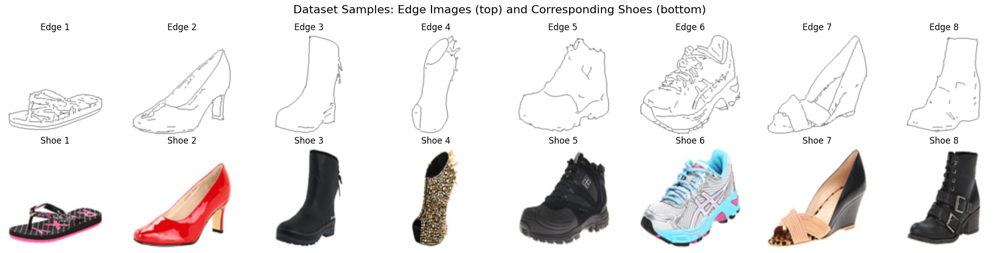


Validation Dataset Samples:


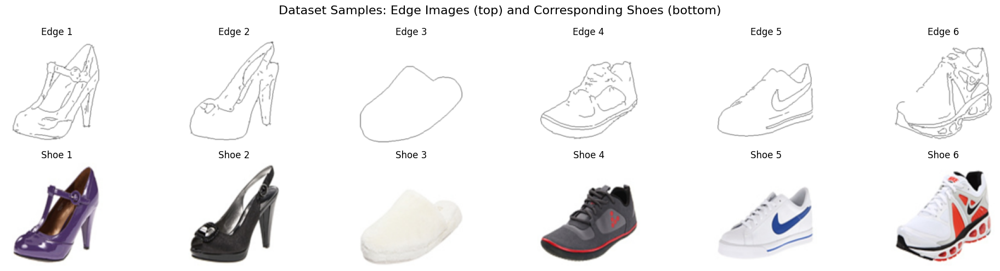

Augmented Training Dataset Samples:


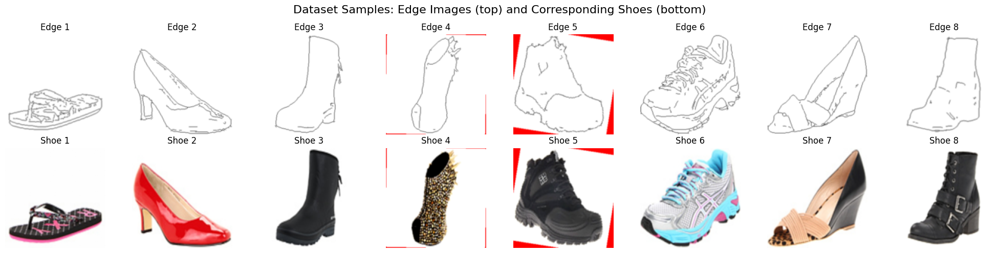

In [ ]:
# Define transforms
transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize to [-1, 1]
])

# Create non-augmented datasets
train_dataset = EdgeShoeDataset(os.path.join(path, 'train'), transform=transform)
val_dataset = EdgeShoeDataset(os.path.join(path, 'val'), transform=transform)

# Create augmented datasets
train_dataset_aug = EdgeShoeDatasetAugmented(
    os.path.join(path, 'train'),
    transform=transform,
    augment=True,
    augment_prob=AUGMENTATION_CONFIG['probability']
)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
train_loader_aug = DataLoader(train_dataset_aug, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
print(f"Augmented training dataset created: {len(train_dataset_aug)} samples")

# Print dataset sizes
print(f"Training samples: {len(train_dataset)}")
print(f"Validation samples: {len(val_dataset)}")
print(f"Training batches: {len(train_loader)}")
print(f"Validation batches: {len(val_loader)}")

# Test by loading one sample
edge_sample, shoe_sample = train_dataset[0]
print(f"Edge image shape: {edge_sample.shape}")
print(f"Shoe image shape: {shoe_sample.shape}")
print(f"Value range - Edge: [{edge_sample.min():.2f}, {edge_sample.max():.2f}]")
print(f"Value range - Shoe: [{shoe_sample.min():.2f}, {shoe_sample.max():.2f}]")

# Plot dataset samples
def denormalize(tensor):
    """Convert from [-1, 1] to [0, 1]"""
    return (tensor + 1) / 2

def plot_dataset_samples(dataset, num_samples=8):
    """Plot sample pairs from the dataset"""
    fig, axes = plt.subplots(2, num_samples, figsize=(20, 5))
    fig.suptitle('Dataset Samples: Edge Images (top) and Corresponding Shoes (bottom)', fontsize=16)

    for i in range(num_samples):
        edge_img, shoe_img = dataset[i]

        # Denormalize and convert to numpy
        edge_np = denormalize(edge_img).permute(1, 2, 0).numpy()
        shoe_np = denormalize(shoe_img).permute(1, 2, 0).numpy()

        # Plot edge image
        axes[0, i].imshow(edge_np)
        axes[0, i].set_title(f'Edge {i+1}')
        axes[0, i].axis('off')

        # Plot shoe image
        axes[1, i].imshow(shoe_np)
        axes[1, i].set_title(f'Shoe {i+1}')
        axes[1, i].axis('off')

    plt.tight_layout()
    plt.show()

# Plot training dataset samples
print("\nTraining Dataset Samples:")
plot_dataset_samples(train_dataset, 8)

# Plot validation dataset samples
print("\nValidation Dataset Samples:")
plot_dataset_samples(val_dataset, 6)


# Plot augmented samples
print("Augmented Training Dataset Samples:")
plot_dataset_samples(train_dataset_aug, 8)


Here I plotted some training data after augmentation to show a realistic view of what the model will "see" during training.
For GANs, which consist of a generator (creating new data) and a discriminator (evaluating real vs. fake data), augmentation can encourage the generator to handle different styles and orientations.


## 5️⃣ Generator Network (U-Net Architecture)

**Task**: Implement a U-Net generator with encoder-decoder structure and skip connections.

**Requirements**:
- Encoder: Progressive downsampling using Conv2d layers
- Decoder: Progressive upsampling using ConvTranspose2d layers  
- Skip connections between corresponding encoder-decoder layers
- Final output uses Tanh activation for [-1,1] range

In [ ]:
class Generator(nn.Module):
    def __init__(self, in_channels=3, out_channels=3):
        super(Generator, self).__init__()

        # Encoder (downsampling)
        self.enc1 = nn.Conv2d(in_channels, 64, 4, 2, 1)  # No BatchNorm for first layer
        self.enc1_act = nn.LeakyReLU(0.2, inplace=True)

        self.enc2 = nn.Sequential(
            nn.Conv2d(64, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True)
        )

        self.enc3 = nn.Sequential(
            nn.Conv2d(128, 256, 4, 2, 1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True)
        )

        self.enc4 = nn.Sequential(
            nn.Conv2d(256, 512, 4, 2, 1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True)
        )

        self.enc5 = nn.Sequential(
            nn.Conv2d(512, 512, 4, 2, 1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True)
        )

        # Bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv2d(512, 512, 4, 2, 1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True)
        )

        # Decoder (upsampling with skip connections)
        self.dec1 = nn.Sequential(
            nn.ConvTranspose2d(512, 512, 4, 2, 1),
            nn.BatchNorm2d(512),
            nn.Dropout(0.5),
            nn.ReLU(inplace=True)
        )

        self.dec2 = nn.Sequential(
            nn.ConvTranspose2d(1024, 512, 4, 2, 1),  # 1024 due to skip connection
            nn.BatchNorm2d(512),
            nn.Dropout(0.5),
            nn.ReLU(inplace=True)
        )

        self.dec3 = nn.Sequential(
            nn.ConvTranspose2d(1024, 256, 4, 2, 1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )

        self.dec4 = nn.Sequential(
            nn.ConvTranspose2d(512, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True)
        )

        self.dec5 = nn.Sequential(
            nn.ConvTranspose2d(256, 64, 4, 2, 1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True)
        )

        self.final = nn.Sequential(
            nn.ConvTranspose2d(128, out_channels, 4, 2, 1),
            nn.Tanh()
        )

    def forward(self, x):
        # Encoder
        e1 = self.enc1_act(self.enc1(x))
        e2 = self.enc2(e1)
        e3 = self.enc3(e2)
        e4 = self.enc4(e3)
        e5 = self.enc5(e4)

        # Bottleneck
        b = self.bottleneck(e5)

        # Decoder with skip connections
        d1 = self.dec1(b)
        d1 = torch.cat([d1, e5], dim=1)  # Skip connection

        d2 = self.dec2(d1)
        d2 = torch.cat([d2, e4], dim=1)  # Skip connection

        d3 = self.dec3(d2)
        d3 = torch.cat([d3, e3], dim=1)  # Skip connection

        d4 = self.dec4(d3)
        d4 = torch.cat([d4, e2], dim=1)  # Skip connection

        d5 = self.dec5(d4)
        d5 = torch.cat([d5, e1], dim=1)  # Skip connection

        output = self.final(d5)
        return output

# Initialize generator
generator = Generator().to(device)
print(f"Generator created with {sum(p.numel() for p in generator.parameters())/1e6:.2f}M parameters")

# Test with random input
test_input = torch.randn(1, 3, IMG_SIZE, IMG_SIZE).to(device)
test_output = generator(test_input)
print(f"Generator test - Input: {test_input.shape}, Output: {test_output.shape}")


Generator created with 29.25M parameters
Generator test - Input: torch.Size([1, 3, 128, 128]), Output: torch.Size([1, 3, 128, 128])



## 6️⃣ Discriminator Network (PatchGAN)

**Task**: Implement a PatchGAN discriminator that classifies image patches as real/fake.

**Requirements**:
- Accept concatenated input (edge + shoe = 6 channels)
- Use strided convolutions for downsampling
- Output a patch-wise classification matrix (not single value)
- Use LeakyReLU activations

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, in_channels=6):  # 3 for edge + 3 for shoe
        super(Discriminator, self).__init__()

        # Layer 1: No BatchNorm for first layer
        self.layer1 = nn.Sequential(
            nn.Conv2d(in_channels, 64, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True)
        )

        # Layer 2
        self.layer2 = nn.Sequential(
            nn.Conv2d(64, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True)
        )

        # Layer 3
        self.layer3 = nn.Sequential(
            nn.Conv2d(128, 256, 4, 2, 1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True)
        )

        # Layer 4
        self.layer4 = nn.Sequential(
            nn.Conv2d(256, 512, 4, 1, 1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True)
        )

        # Final layer
        self.final = nn.Conv2d(512, 1, 4, 1, 1)

    def forward(self, img_A, img_B):
        # Concatenate images along channel dimension
        x = torch.cat([img_A, img_B], dim=1)

        # Pass through discriminator layers
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.final(x)

        return x

# Initialize discriminator
discriminator = Discriminator().to(device)
print(f"Discriminator created with {sum(p.numel() for p in discriminator.parameters())/1e6:.2f}M parameters")

# Test with random inputs
test_edge = torch.randn(1, 3, IMG_SIZE, IMG_SIZE).to(device)
test_shoe = torch.randn(1, 3, IMG_SIZE, IMG_SIZE).to(device)
test_disc_output = discriminator(test_edge, test_shoe)
print(f"Discriminator test - Edge: {test_edge.shape}, Shoe: {test_shoe.shape}, Output: {test_disc_output.shape}")


Discriminator created with 2.77M parameters
Discriminator test - Edge: torch.Size([1, 3, 128, 128]), Shoe: torch.Size([1, 3, 128, 128]), Output: torch.Size([1, 1, 14, 14])


## 7️⃣ Loss Functions and Optimizers

**Task**: Set up loss functions and optimizers for GAN training.

**Requirements**:
- Use appropriate loss functions for adversarial and reconstruction objectives
- Initialize optimizers with given hyperparameters
- Implement weight initialization for stable training

In [ ]:
class PerceptualLoss(nn.Module):
    """
    Perceptual Loss using VGG19 features
    """

    def __init__(self):
        super(PerceptualLoss, self).__init__()

        # Load pre-trained VGG19 model
        vgg = models.vgg19(pretrained=True).features

        # Split VGG19 into slices at key layers
        self.slice1 = nn.Sequential()
        self.slice2 = nn.Sequential()
        self.slice3 = nn.Sequential()
        self.slice4 = nn.Sequential()

        for x in range(4):    # relu1_2
            self.slice1.add_module(str(x), vgg[x])
        for x in range(4, 9):  # relu2_2
            self.slice2.add_module(str(x), vgg[x])
        for x in range(9, 16): # relu3_4
            self.slice3.add_module(str(x), vgg[x])
        for x in range(16, 23): # relu4_4
            self.slice4.add_module(str(x), vgg[x])

        # Freeze VGG parameters
        for param in self.parameters():
            param.requires_grad = False

    def forward(self, generated, target):
        """Compute perceptual loss between generated and target images"""
        # Extract features at multiple levels
        g_relu1_2 = self.slice1(generated)
        g_relu2_2 = self.slice2(g_relu1_2)
        g_relu3_4 = self.slice3(g_relu2_2)
        g_relu4_4 = self.slice4(g_relu3_4)

        t_relu1_2 = self.slice1(target)
        t_relu2_2 = self.slice2(t_relu1_2)
        t_relu3_4 = self.slice3(t_relu2_2)
        t_relu4_4 = self.slice4(t_relu3_4)

        # Compute MSE loss at each feature level
        loss = (
            nn.MSELoss()(g_relu1_2, t_relu1_2) +
            nn.MSELoss()(g_relu2_2, t_relu2_2) +
            nn.MSELoss()(g_relu3_4, t_relu3_4) +
            nn.MSELoss()(g_relu4_4, t_relu4_4)
        )

        return loss

# Initialize perceptual loss
perceptual_loss = PerceptualLoss().to(device)
print("Perceptual loss initialized with VGG19 features")

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:02<00:00, 229MB/s]


Perceptual loss initialized with VGG19 features


In [ ]:
# Define loss functions
criterion_GAN = nn.BCEWithLogitsLoss()
criterion_L1 = nn.L1Loss()

# Create optimizers
optimizer_G = optim.Adam(generator.parameters(), lr=LEARNING_RATE, betas=(BETA1, BETA2))
optimizer_D = optim.Adam(discriminator.parameters(), lr=LEARNING_RATE, betas=(BETA1, BETA2))

# CosineAnnealingLR schedulers
scheduler_G = CosineAnnealingLR(optimizer_G, T_max=NUM_EPOCHS // 2, eta_min=1e-6)  # Two cycles over training
scheduler_D = CosineAnnealingLR(optimizer_D, T_max=NUM_EPOCHS // 2, eta_min=1e-6)  # Same for discriminator


print("CosineAnnealingLR schedulers initialized with T_max =", NUM_EPOCHS // 2)

# Weight initialization function
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# Apply weight initialization
generator.apply(weights_init)
discriminator.apply(weights_init)

print("Loss functions and optimizers initialized")
print("Weight initialization applied to both networks")


CosineAnnealingLR schedulers initialized with T_max = 15
Loss functions and optimizers initialized
Weight initialization applied to both networks


## 8️⃣ Training Loop

**Task**: Implement the main GAN training loop with alternating updates.

**Requirements**:
- Train generator to fool discriminator and match target images
- Train discriminator to distinguish real from generated images
- Balance adversarial loss with L1 reconstruction loss
- Track and display training progress

In [ ]:
# Training tracking
G_losses = []
D_losses = []
L1_losses = []
Perceptual_losses = []
learning_rates = []
epoch_images = []

def save_sample_images(epoch, edge_imgs, real_shoes, fake_shoes, num_samples=4):
    """Save sample images during training"""
    with torch.no_grad():
        # Take first few samples
        edge_sample = edge_imgs[:num_samples]
        real_sample = real_shoes[:num_samples]
        fake_sample = fake_shoes[:num_samples]

        # Denormalize
        edge_sample = denormalize(edge_sample)
        real_sample = denormalize(real_sample)
        fake_sample = denormalize(fake_sample)

        # Create comparison grid
        comparison = torch.cat([edge_sample, fake_sample, real_sample], dim=0)
        grid = make_grid(comparison, nrow=num_samples, padding=2, normalize=False)

        return grid

print("Starting training...")
print("=" * 60)

def train_model(train_set_loader, start_epoch=0):
  print(f"Starting training with {len(train_loader.dataset)} samples for {NUM_EPOCHS} epochs...")
  print("=" * 80)
  for epoch_offset in range(NUM_EPOCHS):
      epoch = start_epoch + epoch_offset
      generator.train()
      discriminator.train()

      epoch_G_loss = 0
      epoch_D_loss = 0
      epoch_L1_loss = 0
      epoch_perceptual_loss = 0

      # Progress bar for the epoch
      pbar = tqdm(train_set_loader, desc=f'Epoch {epoch+1}/{start_epoch + NUM_EPOCHS}')

      for i, (edge_imgs, real_shoes) in enumerate(pbar):
          # Move to device
          edge_imgs = edge_imgs.to(device)
          real_shoes = real_shoes.to(device)
          batch_size = edge_imgs.size(0)

          # Create labels for discriminator
          real_labels = torch.ones(batch_size, 1, 14, 14).to(device)  # Patch size for 128x128 input
          fake_labels = torch.zeros(batch_size, 1, 14, 14).to(device)

          # ---------------------
          #  Train Generator
          # ---------------------
          optimizer_G.zero_grad()

          # Generate fake shoes
          fake_shoes = generator(edge_imgs)

          # Adversarial loss (try to fool discriminator)
          pred_fake = discriminator(edge_imgs, fake_shoes)
          loss_GAN = criterion_GAN(pred_fake, real_labels)

          # L1 loss (reconstruction)
          loss_L1 = criterion_L1(fake_shoes, real_shoes)
          loss_perceptual = perceptual_loss(fake_shoes, real_shoes)

          # Total generator loss
          loss_G = loss_GAN + LAMBDA_L1 * loss_L1 + LAMBDA_PERCEPTUAL * loss_perceptual

          loss_G.backward()
          optimizer_G.step()

          # ---------------------
          #  Train Discriminator
          # ---------------------
          optimizer_D.zero_grad()

          # Real loss
          pred_real = discriminator(edge_imgs, real_shoes)
          loss_real = criterion_GAN(pred_real, real_labels)

          # Fake loss
          pred_fake = discriminator(edge_imgs, fake_shoes.detach())
          loss_fake = criterion_GAN(pred_fake, fake_labels)

          # Total discriminator loss
          loss_D = (loss_real + loss_fake) / 2

          loss_D.backward()
          optimizer_D.step()

          # Update running losses
          epoch_G_loss += loss_G.item()
          epoch_D_loss += loss_D.item()
          epoch_L1_loss += loss_L1.item()
          epoch_perceptual_loss += loss_perceptual.item()

          # Update progress bar
          pbar.set_postfix({
                'G': f'{loss_G.item():.4f}',
                'D': f'{loss_D.item():.4f}',
                'L1': f'{loss_L1.item():.4f}',
                'Perc': f'{loss_perceptual.item():.4f}',
                'LR': f'{optimizer_G.param_groups[0]["lr"]:.6f}'
            })

      # Average losses for the epoch
      avg_G_loss = epoch_G_loss / len(train_set_loader)
      avg_D_loss = epoch_D_loss / len(train_set_loader)
      avg_L1_loss = epoch_L1_loss / len(train_set_loader)
      avg_perceptual_loss = epoch_perceptual_loss / len(train_set_loader)

      G_losses.append(avg_G_loss)
      D_losses.append(avg_D_loss)
      L1_losses.append(avg_L1_loss)
      Perceptual_losses.append(avg_perceptual_loss)
      learning_rates.append(optimizer_G.param_groups[0]['lr'])

      # Print summary
      print(f"Epoch [{epoch+1}]: G_loss: {avg_G_loss:.4f} | D_loss: {avg_D_loss:.4f}")
      print(f"  L1_loss: {avg_L1_loss:.4f} | Perceptual: {avg_perceptual_loss:.4f}")
      print(f"  Learning Rate: {optimizer_G.param_groups[0]['lr']:.6f}")

      # Update schedulers
      scheduler_G.step()
      scheduler_D.step()

      # Save sample images for this epoch
      generator.eval()
      with torch.no_grad():
          sample_grid = save_sample_images(epoch, edge_imgs, real_shoes, fake_shoes)
          epoch_images.append(sample_grid)

      # Plot results for this epoch
      fig, axes = plt.subplots(1, 2, figsize=(15, 5))

      # Loss plot
      axes[0].plot(range(1, len(G_losses) + 1), G_losses, 'b-', label='Generator Loss', linewidth=2)
      axes[0].plot(range(1, len(D_losses) + 1), D_losses, 'r-', label='Discriminator Loss', linewidth=2)
      axes[0].set_xlabel('Epoch')
      axes[0].set_ylabel('Loss')
      axes[0].set_title('Training Losses')
      axes[0].legend()
      axes[0].grid(True)

      # Sample images
      axes[1].imshow(sample_grid.cpu().permute(1, 2, 0))
      axes[1].set_title(f'Epoch {epoch+1}: Edge | Generated | Real')
      axes[1].axis('off')

      plt.tight_layout()
      plt.show()

      print("-" * 60)
  return G_losses, D_losses, L1_losses, Perceptual_losses, learning_rates

print("Training completed!")

Starting training...
Training completed!


Phase 1: Training on Non-Augmented Dataset
Starting training with 49825 samples for 30 epochs...


Epoch 1/30: 100%|██████████| 1558/1558 [04:08<00:00,  6.26it/s, G=84.9421, D=2.6503, L1=0.1489, Perc=6.1194, LR=0.000200]


Epoch [1]: G_loss: 97.3172 | D_loss: 0.1644
  L1_loss: 0.2008 | Perceptual: 7.3788
  Learning Rate: 0.000200


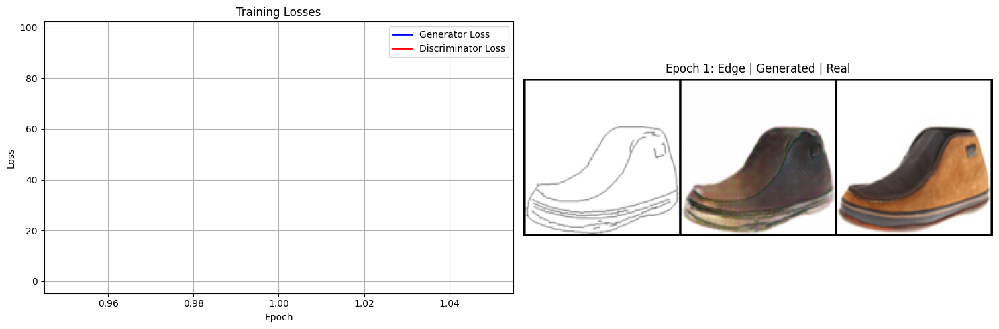

------------------------------------------------------------


Epoch 2/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=114.8040, D=0.4846, L1=0.3285, Perc=7.2798, LR=0.000198]


Epoch [2]: G_loss: 83.9212 | D_loss: 0.1949
  L1_loss: 0.1432 | Perceptual: 6.6116
  Learning Rate: 0.000198


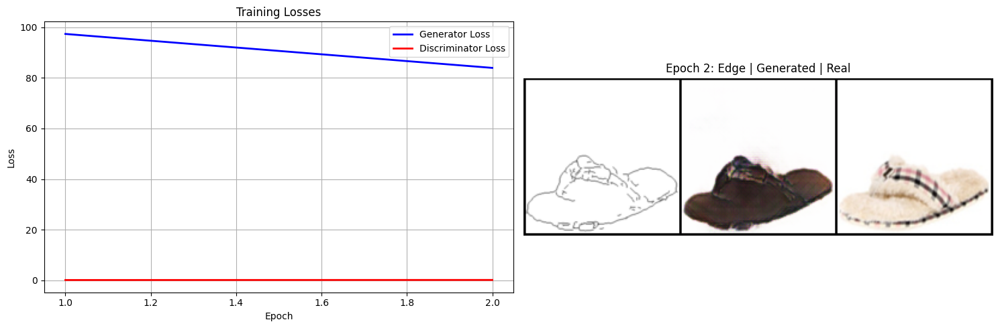

------------------------------------------------------------


Epoch 3/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=97.7660, D=2.6958, L1=0.1022, Perc=8.7534, LR=0.000191]


Epoch [3]: G_loss: 81.2703 | D_loss: 0.2160
  L1_loss: 0.1317 | Perceptual: 6.4697
  Learning Rate: 0.000191


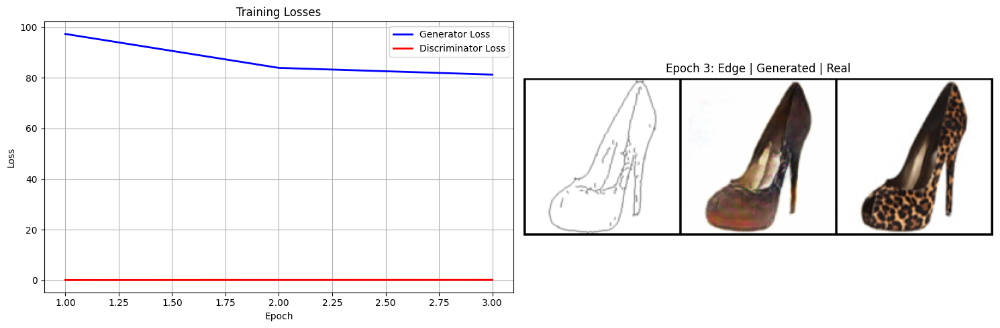

------------------------------------------------------------


Epoch 4/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=53.0361, D=3.5525, L1=0.0615, Perc=4.0649, LR=0.000181]


Epoch [4]: G_loss: 78.7502 | D_loss: 0.2366
  L1_loss: 0.1242 | Perceptual: 6.3220
  Learning Rate: 0.000181


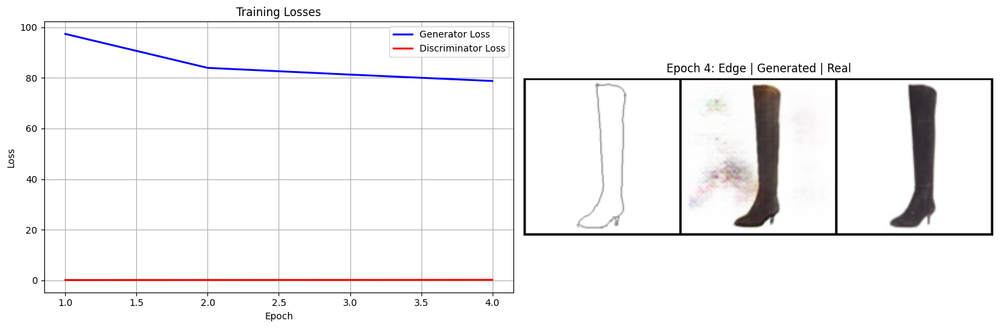

------------------------------------------------------------


Epoch 5/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=156.5224, D=0.0086, L1=0.2569, Perc=12.6261, LR=0.000167]


Epoch [5]: G_loss: 76.7882 | D_loss: 0.2315
  L1_loss: 0.1178 | Perceptual: 6.1931
  Learning Rate: 0.000167


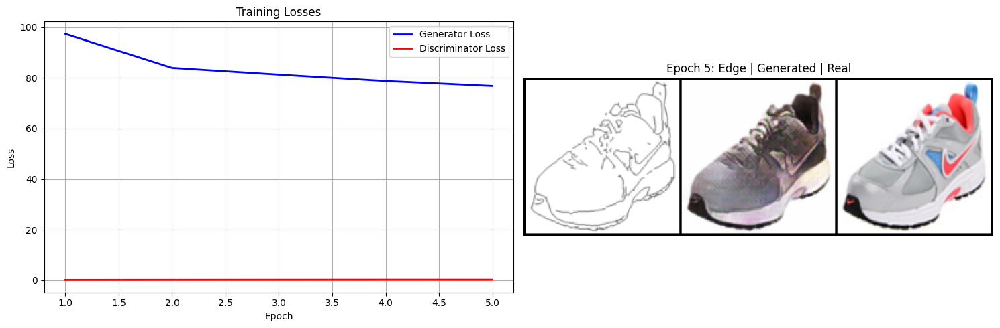

------------------------------------------------------------


Epoch 6/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=63.6233, D=1.2910, L1=0.0974, Perc=4.9287, LR=0.000150]


Epoch [6]: G_loss: 74.8067 | D_loss: 0.2338
  L1_loss: 0.1119 | Perceptual: 6.0637
  Learning Rate: 0.000150


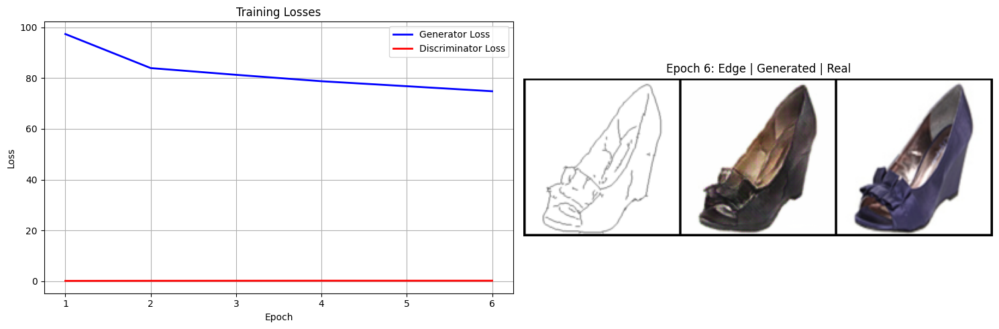

------------------------------------------------------------


Epoch 7/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=46.5964, D=2.8014, L1=0.0416, Perc=3.4730, LR=0.000131]


Epoch [7]: G_loss: 72.9424 | D_loss: 0.2407
  L1_loss: 0.1062 | Perceptual: 5.9447
  Learning Rate: 0.000131


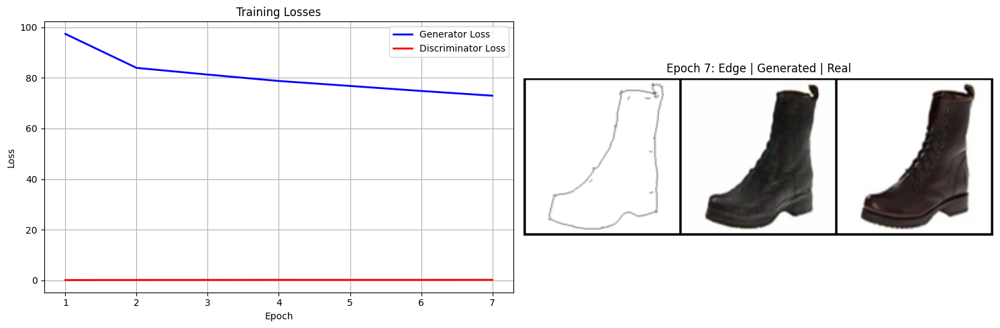

------------------------------------------------------------


Epoch 8/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=84.9911, D=0.6137, L1=0.1347, Perc=6.6057, LR=0.000111]


Epoch [8]: G_loss: 71.6062 | D_loss: 0.2308
  L1_loss: 0.1018 | Perceptual: 5.8589
  Learning Rate: 0.000111


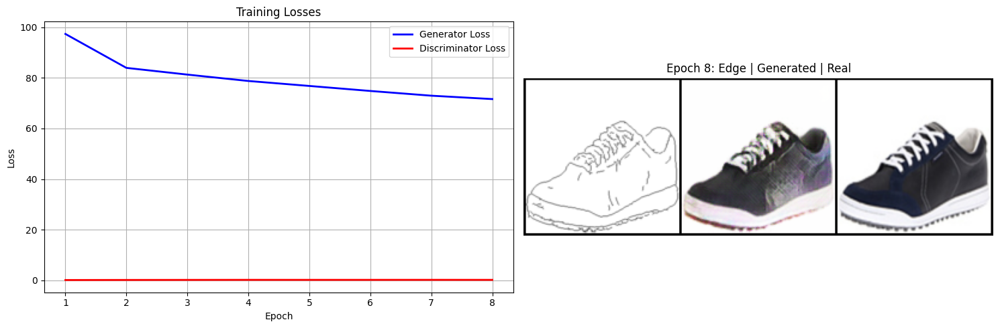

------------------------------------------------------------


Epoch 9/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=62.0530, D=1.5619, L1=0.0674, Perc=5.0884, LR=0.000090]


Epoch [9]: G_loss: 70.3370 | D_loss: 0.2268
  L1_loss: 0.0978 | Perceptual: 5.7783
  Learning Rate: 0.000090


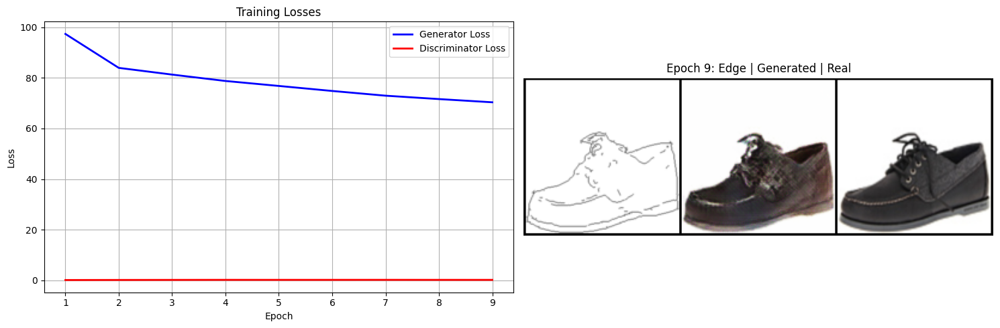

------------------------------------------------------------


Epoch 10/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=62.6584, D=3.3421, L1=0.0708, Perc=4.8859, LR=0.000070]


Epoch [10]: G_loss: 69.0948 | D_loss: 0.2270
  L1_loss: 0.0941 | Perceptual: 5.7004
  Learning Rate: 0.000070


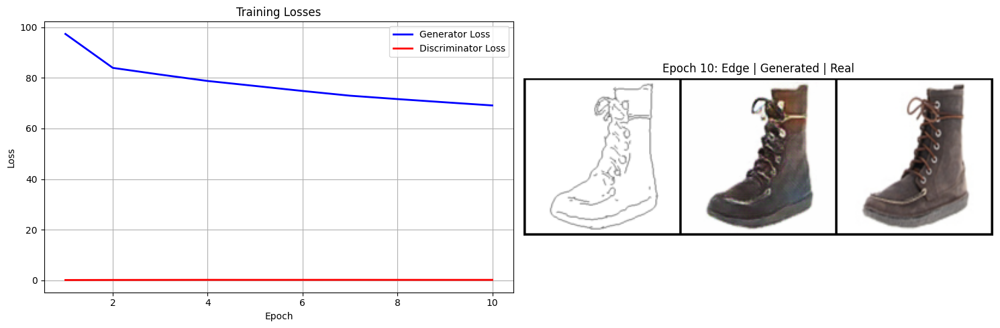

------------------------------------------------------------


Epoch 11/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=98.6009, D=6.1723, L1=0.2039, Perc=7.8211, LR=0.000051]


Epoch [11]: G_loss: 68.0669 | D_loss: 0.2178
  L1_loss: 0.0912 | Perceptual: 5.6303
  Learning Rate: 0.000051


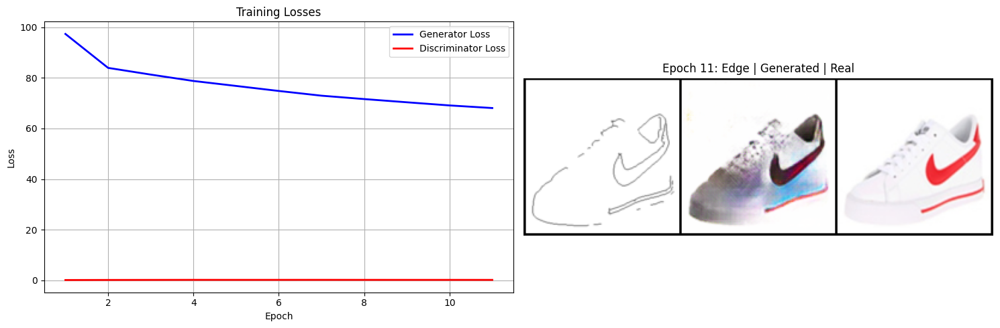

------------------------------------------------------------


Epoch 12/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=58.9576, D=3.2723, L1=0.1287, Perc=3.7190, LR=0.000034]


Epoch [12]: G_loss: 67.2273 | D_loss: 0.2068
  L1_loss: 0.0890 | Perceptual: 5.5752
  Learning Rate: 0.000034


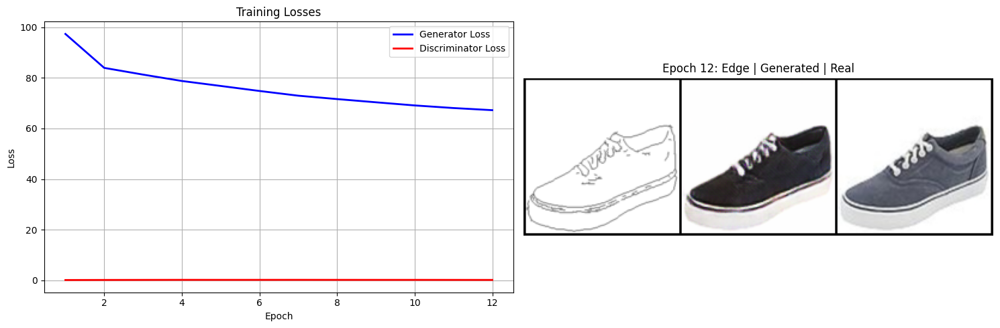

------------------------------------------------------------


Epoch 13/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=68.1615, D=3.0301, L1=0.1438, Perc=5.3774, LR=0.000020]


Epoch [13]: G_loss: 66.6326 | D_loss: 0.1986
  L1_loss: 0.0873 | Perceptual: 5.5390
  Learning Rate: 0.000020


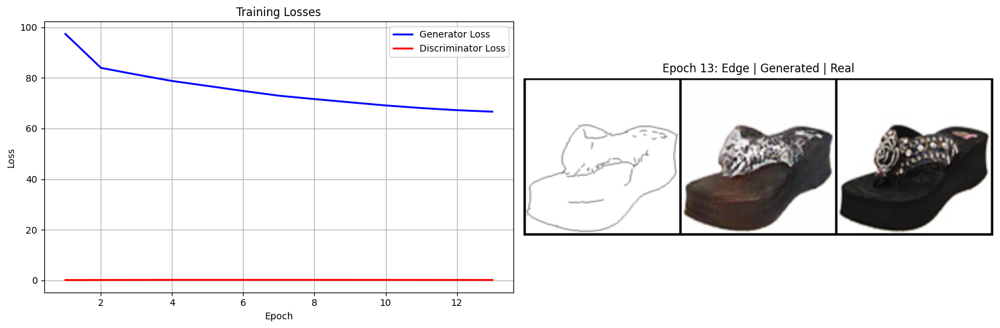

------------------------------------------------------------


Epoch 14/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=104.8681, D=0.4876, L1=0.1489, Perc=8.9281, LR=0.000010]


Epoch [14]: G_loss: 66.1619 | D_loss: 0.1863
  L1_loss: 0.0861 | Perceptual: 5.5049
  Learning Rate: 0.000010


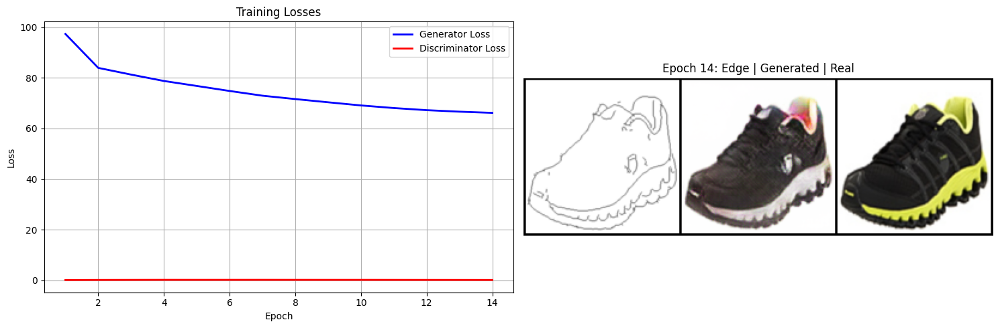

------------------------------------------------------------


Epoch 15/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=81.5166, D=0.6225, L1=0.0871, Perc=7.1139, LR=0.000003]


Epoch [15]: G_loss: 65.9740 | D_loss: 0.1814
  L1_loss: 0.0856 | Perceptual: 5.4977
  Learning Rate: 0.000003


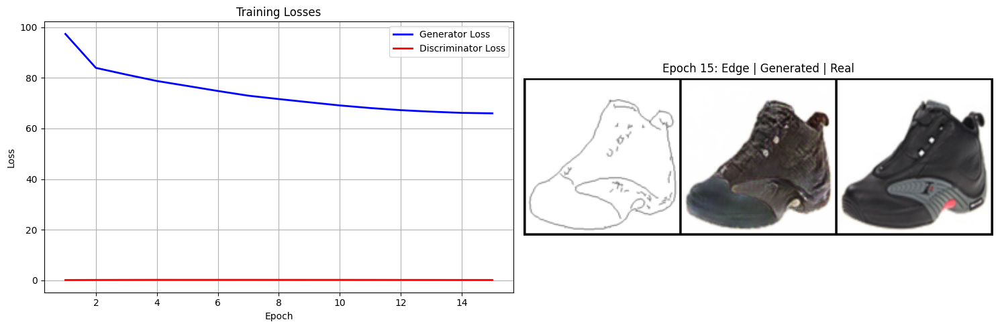

------------------------------------------------------------


Epoch 16/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=42.1120, D=1.9914, L1=0.0507, Perc=3.2277, LR=0.000001]


Epoch [16]: G_loss: 65.8627 | D_loss: 0.1785
  L1_loss: 0.0852 | Perceptual: 5.4887
  Learning Rate: 0.000001


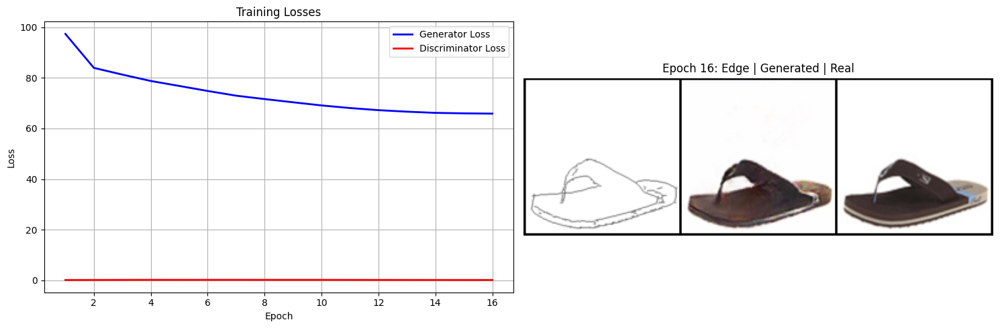

------------------------------------------------------------


Epoch 17/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=129.9961, D=5.1828, L1=0.4111, Perc=8.8863, LR=0.000003]


Epoch [17]: G_loss: 65.9800 | D_loss: 0.1838
  L1_loss: 0.0855 | Perceptual: 5.4972
  Learning Rate: 0.000003


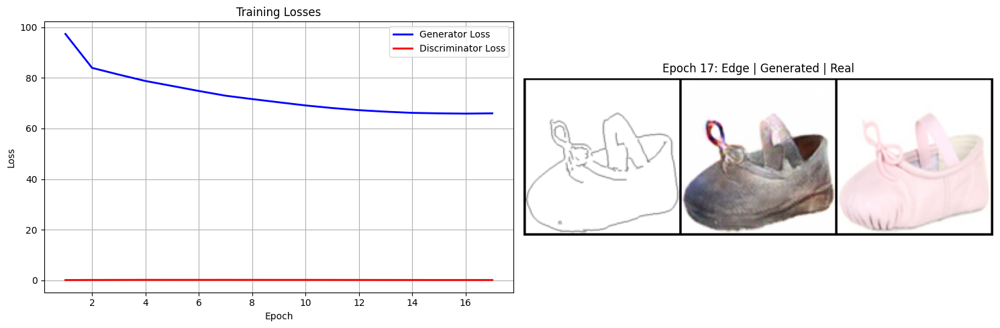

------------------------------------------------------------


Epoch 18/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=71.4942, D=1.9446, L1=0.1040, Perc=6.0958, LR=0.000010]


Epoch [18]: G_loss: 66.0120 | D_loss: 0.1864
  L1_loss: 0.0853 | Perceptual: 5.4961
  Learning Rate: 0.000010


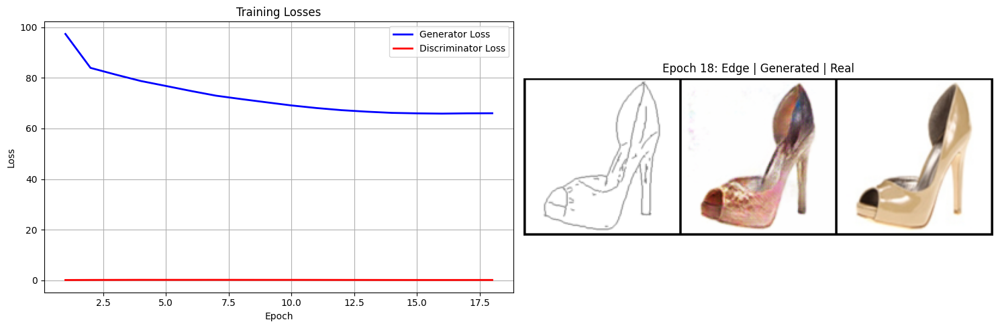

------------------------------------------------------------


Epoch 19/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=72.9266, D=2.5107, L1=0.1283, Perc=6.0009, LR=0.000020]


Epoch [19]: G_loss: 66.0469 | D_loss: 0.1968
  L1_loss: 0.0853 | Perceptual: 5.4899
  Learning Rate: 0.000020


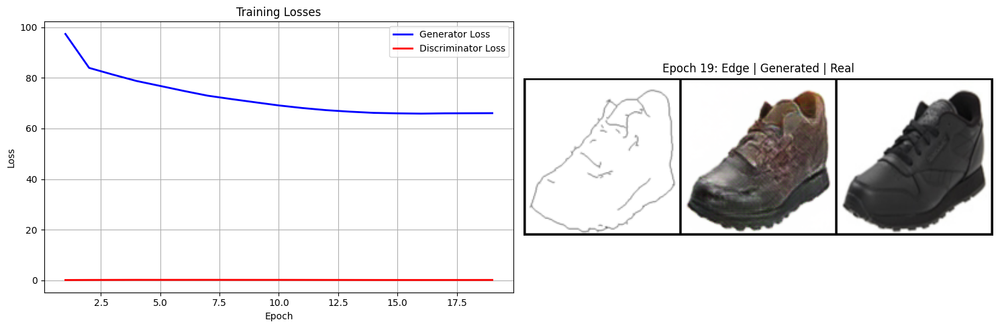

------------------------------------------------------------


Epoch 20/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=48.3797, D=0.1488, L1=0.0574, Perc=4.0449, LR=0.000034]


Epoch [20]: G_loss: 65.9771 | D_loss: 0.2095
  L1_loss: 0.0851 | Perceptual: 5.4727
  Learning Rate: 0.000034


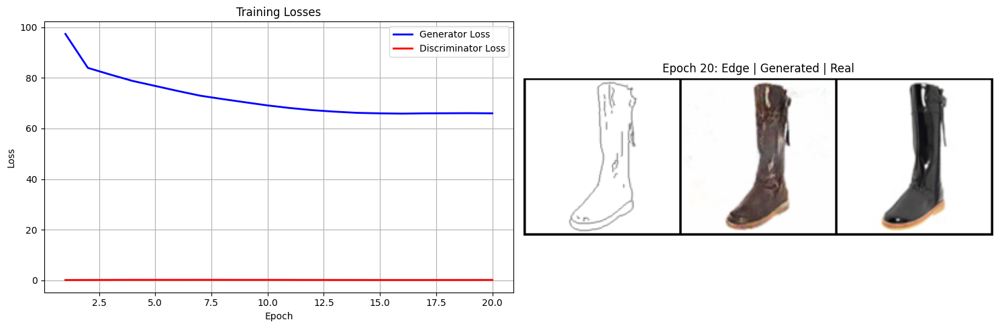

------------------------------------------------------------


Epoch 21/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=107.4152, D=1.1632, L1=0.2004, Perc=8.7203, LR=0.000051]


Epoch [21]: G_loss: 65.9544 | D_loss: 0.2266
  L1_loss: 0.0852 | Perceptual: 5.4612
  Learning Rate: 0.000051


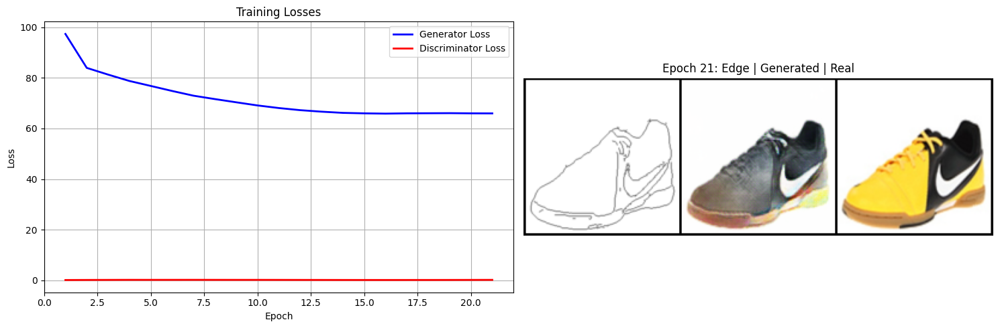

------------------------------------------------------------


Epoch 22/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=72.7943, D=1.7317, L1=0.1002, Perc=5.5191, LR=0.000070]


Epoch [22]: G_loss: 65.7491 | D_loss: 0.2414
  L1_loss: 0.0851 | Perceptual: 5.4322
  Learning Rate: 0.000070


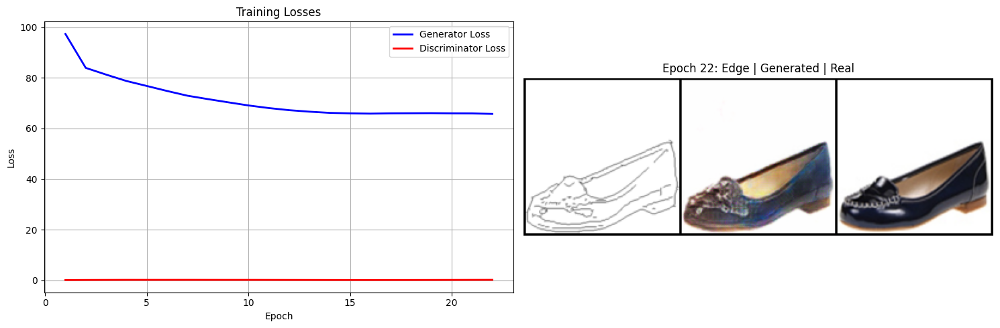

------------------------------------------------------------


Epoch 23/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=35.9353, D=4.7384, L1=0.0352, Perc=2.3836, LR=0.000090]


Epoch [23]: G_loss: 65.5196 | D_loss: 0.2599
  L1_loss: 0.0852 | Perceptual: 5.4065
  Learning Rate: 0.000090


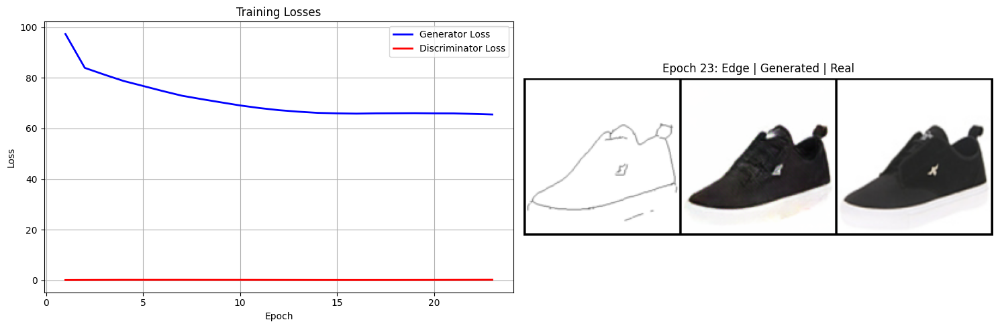

------------------------------------------------------------


Epoch 24/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=49.2158, D=1.9895, L1=0.0744, Perc=4.1693, LR=0.000111]


Epoch [24]: G_loss: 65.1722 | D_loss: 0.2752
  L1_loss: 0.0849 | Perceptual: 5.3635
  Learning Rate: 0.000111


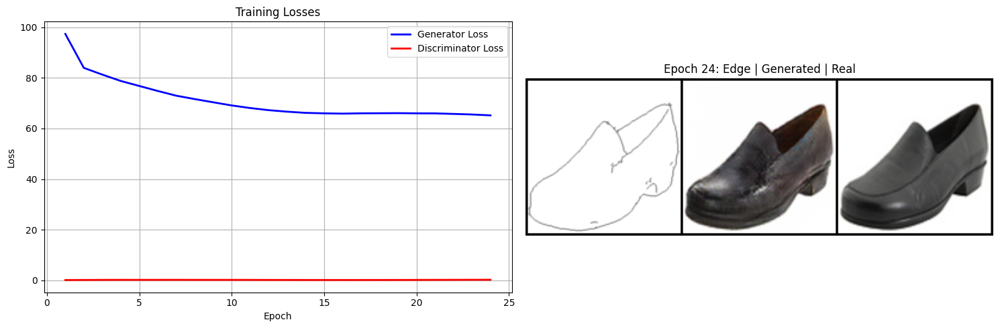

------------------------------------------------------------


Epoch 25/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=51.6146, D=0.2867, L1=0.0780, Perc=3.8029, LR=0.000131]


Epoch [25]: G_loss: 65.1695 | D_loss: 0.2697
  L1_loss: 0.0853 | Perceptual: 5.3608
  Learning Rate: 0.000131


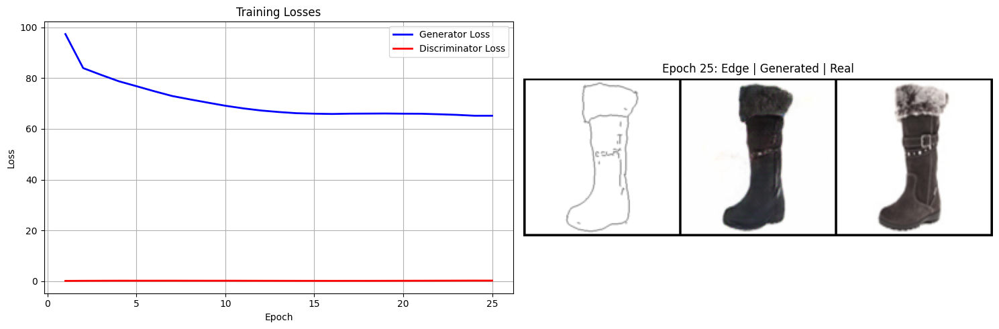

------------------------------------------------------------


Epoch 26/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=72.4472, D=1.5743, L1=0.1369, Perc=5.2535, LR=0.000150]


Epoch [26]: G_loss: 64.9011 | D_loss: 0.2696
  L1_loss: 0.0851 | Perceptual: 5.3320
  Learning Rate: 0.000150


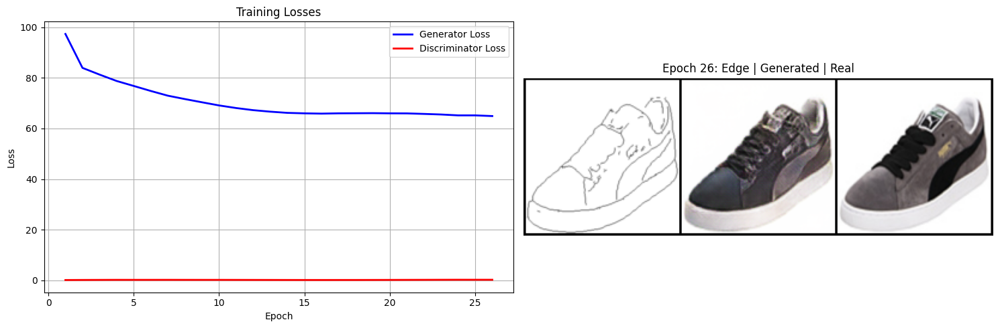

------------------------------------------------------------


Epoch 27/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=46.8976, D=1.5277, L1=0.0583, Perc=3.5637, LR=0.000167]


Epoch [27]: G_loss: 64.5848 | D_loss: 0.2752
  L1_loss: 0.0848 | Perceptual: 5.3024
  Learning Rate: 0.000167


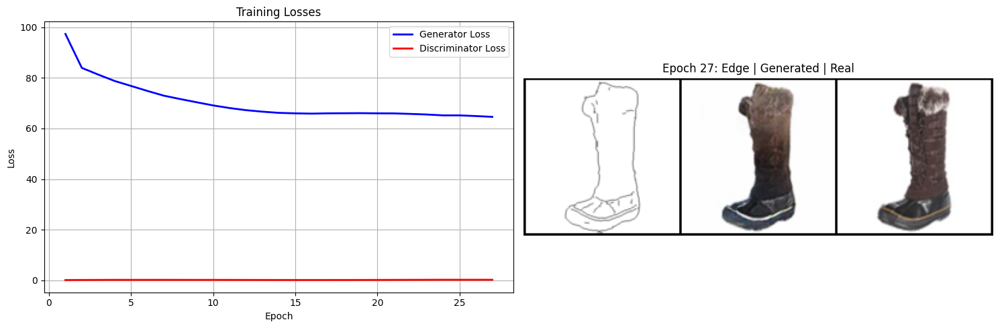

------------------------------------------------------------


Epoch 28/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=95.9095, D=0.2301, L1=0.1820, Perc=7.5739, LR=0.000181]


Epoch [28]: G_loss: 64.1043 | D_loss: 0.2715
  L1_loss: 0.0839 | Perceptual: 5.2641
  Learning Rate: 0.000181


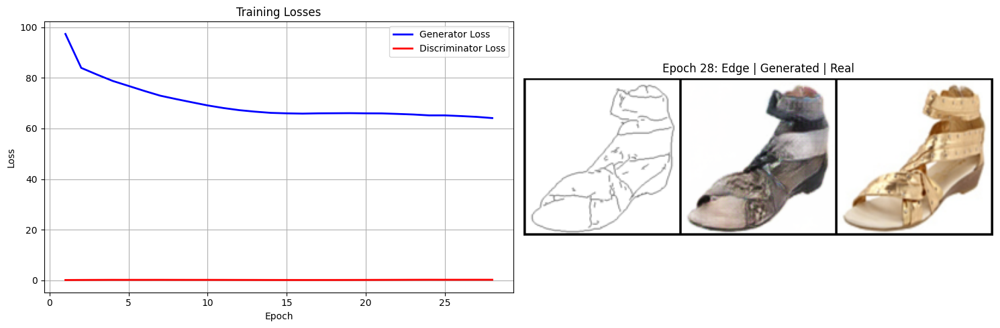

------------------------------------------------------------


Epoch 29/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=75.3105, D=0.0418, L1=0.2414, Perc=4.8306, LR=0.000191]


Epoch [29]: G_loss: 63.7702 | D_loss: 0.2710
  L1_loss: 0.0835 | Perceptual: 5.2316
  Learning Rate: 0.000191


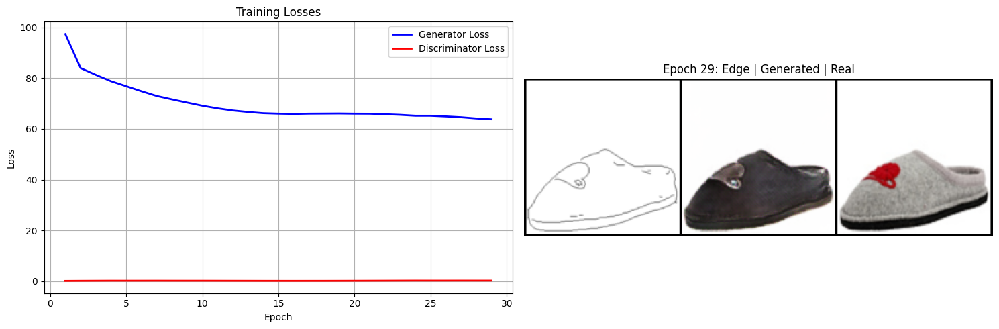

------------------------------------------------------------


Epoch 30/30: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=45.3555, D=0.0598, L1=0.0733, Perc=3.5421, LR=0.000198]


Epoch [30]: G_loss: 63.0682 | D_loss: 0.2689
  L1_loss: 0.0821 | Perceptual: 5.1777
  Learning Rate: 0.000198


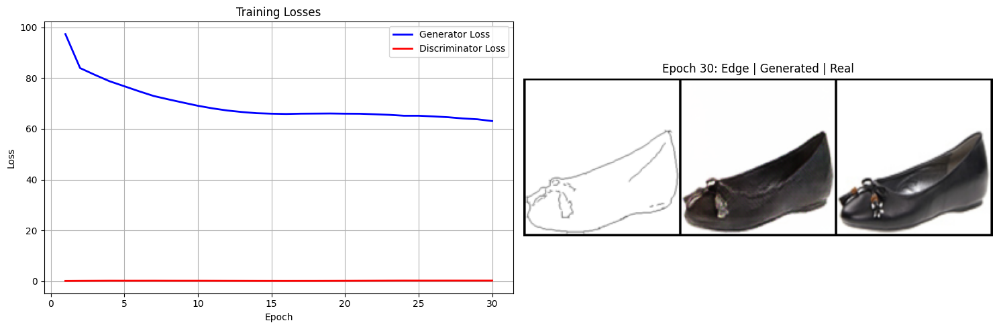

------------------------------------------------------------


([97.3172251220233,
  83.92122576203059,
  81.2702642986802,
  78.7501944540707,
  76.78821633746597,
  74.80667761874903,
  72.94237089585584,
  71.60622846973111,
  70.33700541446083,
  69.0948436771339,
  68.0668689154844,
  67.2273311566021,
  66.63260070105419,
  66.16187507227848,
  65.97398346838504,
  65.86265563719998,
  65.97995283055826,
  66.01202718712705,
  66.04686033373773,
  65.97714958386794,
  65.95439600424221,
  65.74906547752057,
  65.5195646592068,
  65.17218673764818,
  65.16950403343269,
  64.90110617455224,
  64.5847766567715,
  64.1042990164212,
  63.77015001936044,
  63.068175292596585],
 [0.1643715428549495,
  0.19494051055262995,
  0.21598370461031288,
  0.23661317016608985,
  0.23153767283032714,
  0.2337860199772252,
  0.2406935138521484,
  0.23077037635310738,
  0.2268476208817783,
  0.22696646206757587,
  0.2177579745821253,
  0.20678890552264143,
  0.19861208962274188,
  0.186301868894306,
  0.18143387684306855,
  0.17852041859356674,
  0.183841185892

In [ ]:
# Phase 1: Train on non-augmented dataset for 30 epochs
print("Phase 1: Training on Non-Augmented Dataset")
G_losses, D_losses, L1_losses, Perceptual_losses, learning_rates = [], [], [], [], []  # Reset tracking lists if needed
train_model(train_loader, start_epoch=0)

In [ ]:
# Function to plot detailed loss analysis for each epoch
def plot_detailed_loss_analysis(G_losses, D_losses, L1_losses, Perceptual_losses, learning_rates):
    """
    Create comprehensive loss analysis plots for each epoch
    """
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    epochs = range(1, len(G_losses) + 1)

    # Row 1: Individual Loss Components
    axes[0, 0].plot(epochs, G_losses, 'b-', linewidth=2, marker='o', markersize=4)
    axes[0, 0].set_title('Generator Loss (Adversarial)', fontsize=12, fontweight='bold')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Loss')
    axes[0, 0].grid(True, alpha=0.3)
    axes[0, 0].set_facecolor('#f8f9fa')

    axes[0, 1].plot(epochs, D_losses, 'r-', linewidth=2, marker='s', markersize=4)
    axes[0, 1].set_title('Discriminator Loss', fontsize=12, fontweight='bold')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('Loss')
    axes[0, 1].grid(True, alpha=0.3)
    axes[0, 1].set_facecolor('#f8f9fa')

    axes[0, 2].plot(epochs, L1_losses, 'g-', linewidth=2, marker='^', markersize=4)
    axes[0, 2].set_title('L1 Reconstruction Loss', fontsize=12, fontweight='bold')
    axes[0, 2].set_xlabel('Epoch')
    axes[0, 2].set_ylabel('Loss')
    axes[0, 2].grid(True, alpha=0.3)
    axes[0, 2].set_facecolor('#f8f9fa')

    axes[0, 3].plot(epochs, Perceptual_losses, 'm-', linewidth=2, marker='d', markersize=4)
    axes[0, 3].set_title('Perceptual Loss (VGG19)', fontsize=12, fontweight='bold')
    axes[0, 3].set_xlabel('Epoch')
    axes[0, 3].set_ylabel('Loss')
    axes[0, 3].grid(True, alpha=0.3)
    axes[0, 3].set_facecolor('#f8f9fa')

    # Row 2: Comparative Analysis - Loss Ratios and Relationships
    g_d_ratios = [g/d for g, d in zip(G_losses, D_losses)]
    axes[1, 0].plot(epochs, g_d_ratios, 'purple', linewidth=3)
    axes[1, 0].axhline(y=1, color='black', linestyle='--', alpha=0.7, label='Perfect Balance')
    axes[1, 0].fill_between(epochs, 0.5, 2.0, alpha=0.2, color='green', label='Stable Range')
    axes[1, 0].set_title('G/D Loss Ratio (Training Balance)', fontsize=12, fontweight='bold')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('Ratio')
    axes[1, 0].legend()
    axes[1, 0].grid(True, alpha=0.3)
    axes[1, 0].set_facecolor('#f8f9fa')

    # Combined Generator Loss Components
    axes[1, 1].plot(epochs, G_losses, 'b-', label='Adversarial', alpha=0.6)
    axes[1, 1].plot(epochs, [l * LAMBDA_L1 for l in L1_losses], 'g-', label=f'L1 (×{LAMBDA_L1})', alpha=0.6)
    axes[1, 1].plot(epochs, [p * LAMBDA_PERCEPTUAL for p in Perceptual_losses], 'm-', label=f'Perceptual (×{LAMBDA_PERCEPTUAL})', alpha=0.6)
    axes[1, 1].set_title('Weighted Generator Loss Components', fontsize=12, fontweight='bold')
    axes[1, 1].set_xlabel('Epoch')
    axes[1, 1].set_ylabel('Weighted Loss')
    axes[1, 1].legend()
    axes[1, 1].grid(True, alpha=0.3)
    axes[1, 1].set_facecolor('#f8f9fa')

    # Learning Rate Schedule
    axes[1, 2].plot(epochs, learning_rates, 'orange', linewidth=3, marker='*', markersize=6)
    axes[1, 2].set_title('Learning Rate Schedule', fontsize=12, fontweight='bold')
    axes[1, 2].set_xlabel('Epoch')
    axes[1, 2].set_ylabel('Learning Rate')
    axes[1, 2].set_yscale('log')
    axes[1, 2].grid(True, alpha=0.3)
    axes[1, 2].set_facecolor('#f8f9fa')

    # Total Generator Loss
    total_g_loss = [g + l*LAMBDA_L1 + p*LAMBDA_PERCEPTUAL for g, l, p in zip(G_losses, L1_losses, Perceptual_losses)]
    axes[1, 3].plot(epochs, total_g_loss, 'darkblue', linewidth=3, marker='x', markersize=5)
    axes[1, 3].set_title('Total Generator Loss', fontsize=12, fontweight='bold')
    axes[1, 3].set_xlabel('Epoch')
    axes[1, 3].set_ylabel('Combined Loss')
    axes[1, 3].grid(True, alpha=0.3)
    axes[1, 3].set_facecolor('#f8f9fa')

    # Row 3: Loss Improvements and Stability
    # Percentage Improvement from First Epoch
    if len(L1_losses) > 1:
        l1_improve = [(L1_losses[0] - l) / L1_losses[0] * 100 for l in L1_losses]
        perc_improve = [(Perceptual_losses[0] - p) / Perceptual_losses[0] * 100 for p in Perceptual_losses]
        axes[2, 0].plot(epochs, l1_improve, 'g-', label='L1 Improvement', linewidth=2)
        axes[2, 0].plot(epochs, perc_improve, 'm-', label='Perceptual Improvement', linewidth=2)
        axes[2, 0].set_title('Improvement from Epoch 1 (%)', fontsize=12, fontweight='bold')
        axes[2, 0].set_xlabel('Epoch')
        axes[2, 0].set_ylabel('Improvement (%)')
        axes[2, 0].legend()
        axes[2, 0].grid(True, alpha=0.3)
        axes[2, 0].set_facecolor('#f8f9fa')

    # Loss Smoothness (Change between Epochs)
    if len(G_losses) > 1:
        g_smooth = [abs(G_losses[i] - G_losses[i-1]) for i in range(1, len(G_losses))]
        d_smooth = [abs(D_losses[i] - D_losses[i-1]) for i in range(1, len(D_losses))]
        axes[2, 1].plot(range(2, len(G_losses) + 1), g_smooth, 'b-', label='Generator', linewidth=2)
        axes[2, 1].plot(range(2, len(D_losses) + 1), d_smooth, 'r-', label='Discriminator', linewidth=2)
        axes[2, 1].set_title('Loss Smoothness (|ΔLoss|)', fontsize=12, fontweight='bold')
        axes[2, 1].set_xlabel('Epoch')
        axes[2, 1].set_ylabel('|Loss Change|')
        axes[2, 1].legend()
        axes[2, 1].grid(True, alpha=0.3)
        axes[2, 1].set_facecolor('#f8f9fa')

    # Normalized Losses for Comparison
    def normalize_loss(losses):
        min_val, max_val = min(losses), max(losses)
        if max_val == min_val:
            return [1.0] * len(losses)
        return [(x - min_val) / (max_val - min_val) for x in losses]

    axes[2, 2].plot(epochs, normalize_loss(G_losses), 'b-', label='Generator', linewidth=2)
    axes[2, 2].plot(epochs, normalize_loss(D_losses), 'r-', label='Discriminator', linewidth=2)
    axes[2, 2].plot(epochs, normalize_loss(L1_losses), 'g-', label='L1 Loss', linewidth=2)
    axes[2, 2].plot(epochs, normalize_loss(Perceptual_losses), 'm-', label='Perceptual', linewidth=2)
    axes[2, 2].set_title('Normalized Losses Comparison', fontsize=12, fontweight='bold')
    axes[2, 2].set_xlabel('Epoch')
    axes[2, 2].set_ylabel('Normalized Loss (0-1)')
    axes[2, 2].legend()
    axes[2, 2].grid(True, alpha=0.3)
    axes[2, 2].set_facecolor('#f8f9fa')

    # Hide unused subplot
    axes[2, 3].axis('off')

    plt.tight_layout()
    plt.show()

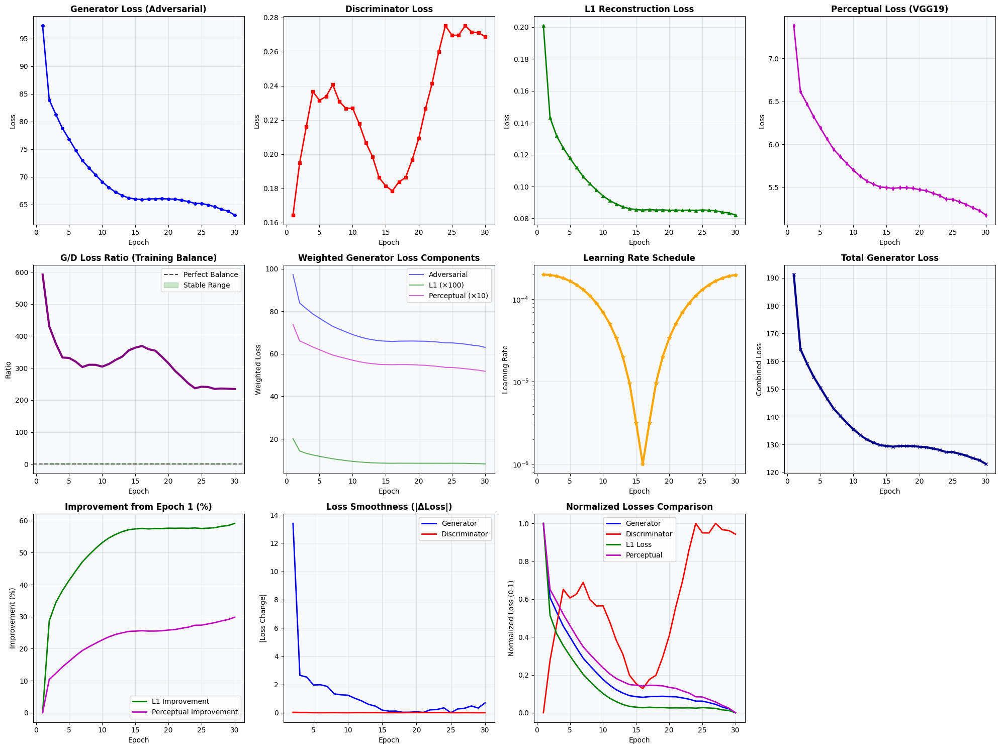

In [ ]:
plot_detailed_loss_analysis(G_losses, D_losses, L1_losses, Perceptual_losses, learning_rates)



## 9️⃣ Evaluation and Visualization

**Task**: Evaluate your trained model and visualize results.

**Requirements**:
- Generate shoes from validation edge images
- Compare with ground truth shoes
- Create side-by-side visualizations


Generating validation results...


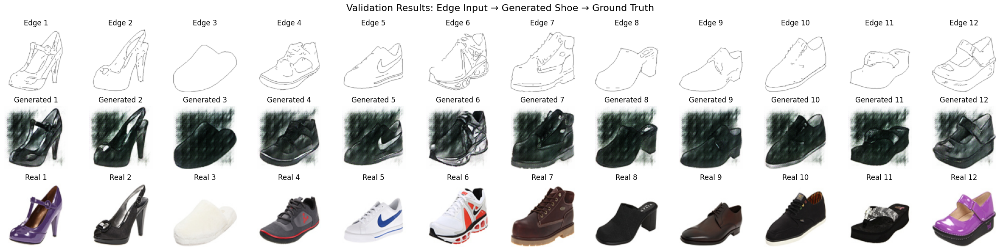

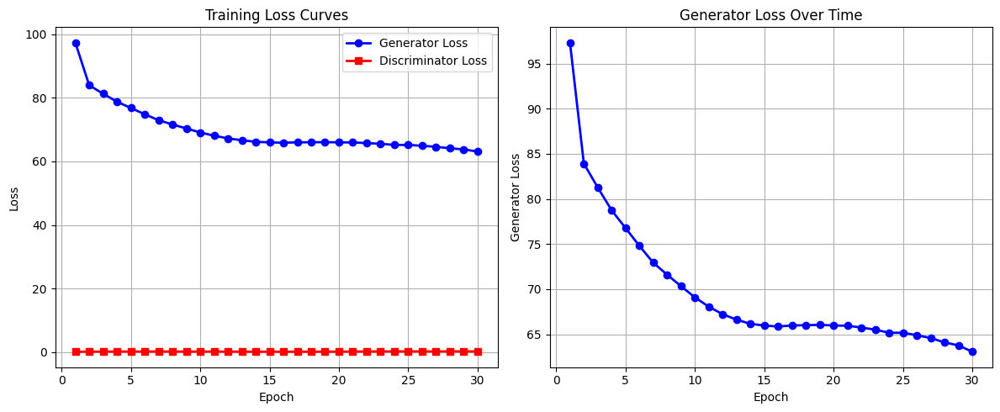


Training Progression:


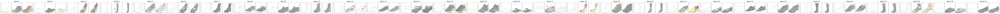

In [ ]:
# Set models to evaluation mode
generator.eval()
discriminator.eval()

def create_comparison_grid(val_loader, num_samples=10):
    """Create a comprehensive comparison grid"""
    generator.eval()

    edges_all = []
    reals_all = []
    fakes_all = []

    with torch.no_grad():
        for edge_imgs, real_shoes in val_loader:
            edge_imgs = edge_imgs.to(device)
            fake_shoes = generator(edge_imgs)

            edges_all.append(edge_imgs.cpu())
            reals_all.append(real_shoes.cpu())
            fakes_all.append(fake_shoes.cpu())

            if len(edges_all) * BATCH_SIZE >= num_samples:
                break

    # Concatenate all batches
    edges_all = torch.cat(edges_all, dim=0)[:num_samples]
    reals_all = torch.cat(reals_all, dim=0)[:num_samples]
    fakes_all = torch.cat(fakes_all, dim=0)[:num_samples]

    return edges_all, fakes_all, reals_all

# Generate validation results
print("Generating validation results...")
edges, fakes, reals = create_comparison_grid(val_loader, 12)

# Create detailed visualization
fig, axes = plt.subplots(3, 12, figsize=(24, 6))
fig.suptitle('Validation Results: Edge Input → Generated Shoe → Ground Truth', fontsize=16)

for i in range(12):
    # Denormalize images
    edge_img = denormalize(edges[i]).permute(1, 2, 0).numpy()
    fake_img = denormalize(fakes[i]).permute(1, 2, 0).numpy()
    real_img = denormalize(reals[i]).permute(1, 2, 0).numpy()

    # Edge input
    axes[0, i].imshow(edge_img)
    axes[0, i].set_title(f'Edge {i+1}')
    axes[0, i].axis('off')

    # Generated shoe
    axes[1, i].imshow(fake_img)
    axes[1, i].set_title(f'Generated {i+1}')
    axes[1, i].axis('off')

    # Real shoe
    axes[2, i].imshow(real_img)
    axes[2, i].set_title(f'Real {i+1}')
    axes[2, i].axis('off')

plt.tight_layout()
plt.show()

# Plot final training curves
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(range(1, len(G_losses)+1), G_losses, 'b-', label='Generator Loss', linewidth=2, marker='o')
plt.plot(range(1, len(D_losses)+1), D_losses, 'r-', label='Discriminator Loss', linewidth=2, marker='s')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Curves')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(range(1, len(G_losses)+1), G_losses, 'b-', linewidth=2, marker='o')
plt.xlabel('Epoch')
plt.ylabel('Generator Loss')
plt.title('Generator Loss Over Time')
plt.grid(True)

plt.tight_layout()
plt.show()

# Display training progression
print("\nTraining Progression:")
fig, axes = plt.subplots(1, len(epoch_images), figsize=(4*len(epoch_images), 4))
if len(epoch_images) == 1:
    axes = [axes]

for i in range(len(epoch_images)):
    # Add the denormalize function here
    img_to_show = denormalize(epoch_images[i]).cpu().permute(1, 2, 0)

    axes[i].imshow(img_to_show)
    axes[i].set_title(f'Epoch {i+1}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

## 🔟 Analysis

**Task**: Analyze your results

**Requirements**:
- Evaluate the quality of generated images
- Discuss strengths and limitations of your model
- Test the effect of different hyperparameters (optional)


First, I set up the Edge2Shoes dataset, which was provided.  Each image in the dataset is a composite of an edge sketch (left half) and its corresponding shoe image (right half).

I then implemented a custom EdgeShoeDataset class in PyTorch to handle this specific data format, designed to load each composite image from the dataset directory, split the image into its left (edge sketch) and right (shoe) halves, and apply the necessary image transformations, such as resizing, converting to tensors, and normalizing the pixel values to the range [-1, 1].

To improve the model's robustness and prevent overfitting, I also created an EdgeShoeDatasetAugmented class. This class inherits the functionality of the first dataset class but adds data augmentation with a 70% probability of being applied to each sample.

Finally, I created DataLoader instances for both the training and validation sets, with and without augmentation, to efficiently load the data in batches during the training process.

**Model Architecture**

I implemented a conditional Generative Adversarial Network (cGAN) for this task:
- U-Net architecture for the generator. The U-Net's encoder-decoder structure with skip connections is well-suited for image-to-image translation tasks as it allows the model to preserve low-level image features while learning high-level abstractions.
- For the discriminator, I implemented a PatchGAN model. Instead of classifying the entire image as real or fake, the PatchGAN classifies N x N patches of the input image. This encourages the generator to produce more realistic details across the entire image.

** Loss Functions **

- Adversarial Loss: standard binary cross-entropy loss to train the discriminator and generator in an adversarial manner.
- L1 Loss (MAE) between the generated image and the target shoe image. This encourages the generator to produce images that are structurally similar to the ground truth.
- Perceptual Loss: To further improve the visual quality of the generated images, I implemented a perceptual loss function using a pre-trained VGG19 network. This loss measures the difference between the generated and target images in a high-level feature space, which often corresponds better with human perception of image similarity.
https://arxiv.org/pdf/2302.04032


**Training Process**

I used the Adam optimizer for both the generator and discriminator and a Cosine Annealing learning rate scheduler to adjust the learning rate during training.

**Hyperparameters**

- Final Generator Loss: 63.0682
- Final Discriminator Loss: 0.2689
- Loss Ratio (G/D): 234.54

- Generator Parameters: 29,248,515 (29.25M)
- Discriminator Parameters: 2,769,601 (2.77M)
- Total Parameters: 32,018,116 (32.02M)

I initially used `IMG_SIZE = 64` to speed the training, but it didn't capture relevant details and I lost resolution.
So I eventually used `IMG_SIZE = 128` for higher resolution.
Also, I tried reducing `BATCH_SIZE = 4`, but a small batch size can create noisy gradient, so I increased `BATCH_SIZE = 32` for a more stable estimate of the gradient, leading to a smoother training process.

**Results**

The loss plots show the  model's learning progress:

- Generator loss (adversarial) shows how well the generator is fooling the discriminator. The steady decrease indicates the generator is getting progressively better at creating realistic images that the discriminator mistakes for real ones.

- Discriminator loss shows how well the discriminator is distinguishing real images from fakes. The oscillation reflects the "zero-sum" game: as the generator improves (its loss goes down), the discriminator's job gets harder (its loss goes up), forcing it to learn and adapt.

- L1 Reconstruction Loss is a pixel-level comparison between the generated image and the ground truth. The smooth, steep decline shows that the generator is quickly learning to produce images with the correct overall structure, color, and content.

- Perceptual Loss (VGG19) measures high-level feature similarity. Its decrease confirms the generated images are becoming not just pixel-correct, but also visually and semantically similar to the target images, leading to more realistic textures and details.

- G/D Loss ratio shows the balance of power between the generator (G) and discriminator (D). The plot shows an initial adjustment period before the ratio settles, indicating that neither network is overpowering the other.

- Weighted Generator Loss Components helps understanding what the generator is prioritizing.

- Learning Rate Schedule shows the CosineAnnealingLR progress.

- Total Generator Loss is the combined, weighted loss that the generator is actually optimizing.

- Improvement from Epoch 1 plot translates the raw loss values into a measure of progress (%). We can see that the L1 and Perceptual losses have improved by over 60% and 25% respectively.

- Loss Smoothness (|ΔLoss|) measures training volatility. The large spikes at the beginning are normal, as the model makes big adjustments. The fact that the changes become much smaller over time indicates that the training has stabilized and is converging smoothly.

- Normalized Loss Comparison: comparison of shapes and trends directly of the losses scaled between [0,1], ignoring their different magnitudes.


**Validation set analysis**

The validation set generated shoes have artifacts in the background. The culprit might be the BatchNormalization layer. When we plot the generated image from the training epoch we are in training mode. BatchNorm normlizes the image features using the mean and variance of the current batch. In evaluation mode instead batchNorm uses the global mean and variance thaat has been accumulating dutring the training process. These global statistics have become "polluted" and are not representative or what is needed to produce a white background, and the statistics of the complex shoe features are likely interfering with the simple background features.
 A staandard solution is to use te Instance Normalization instead of BatchNorm, as it normalizes the features for each image individually within a batch, not across the entire batch.

# **Augmented model training**


Phase 2: Switching to Augmented Dataset
Initializing new models for a fresh training session...
Initializing new optimizers...
Clearing loss history...
Starting training with 49825 samples for 15 epochs...


Epoch 1/15: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=127.0791, D=1.0424, L1=0.4312, Perc=7.6170, LR=0.000200]


Epoch [1]: G_loss: 117.4003 | D_loss: 0.1478
  L1_loss: 0.2685 | Perceptual: 8.6553
  Learning Rate: 0.000200


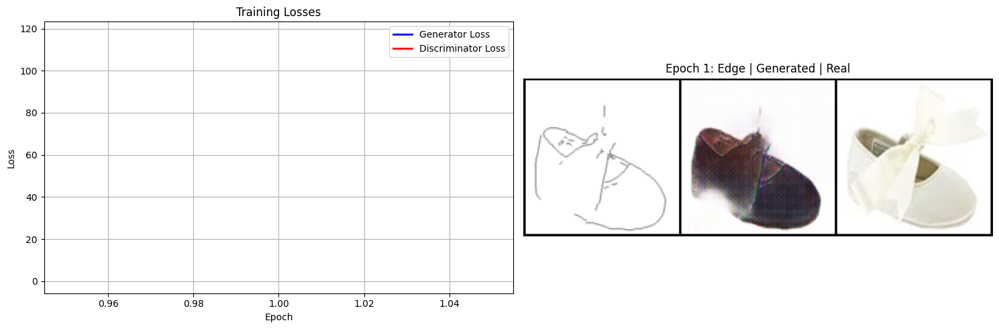

------------------------------------------------------------


Epoch 2/15: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=102.2984, D=0.5423, L1=0.3727, Perc=6.0041, LR=0.000195]


Epoch [2]: G_loss: 94.8861 | D_loss: 0.1277
  L1_loss: 0.1914 | Perceptual: 7.1611
  Learning Rate: 0.000195


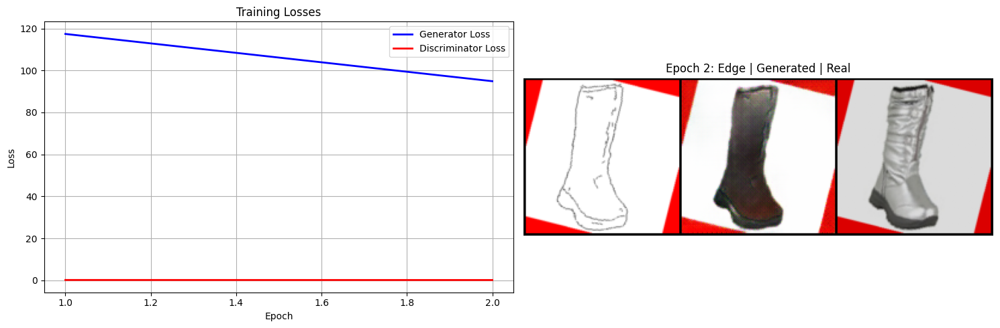

------------------------------------------------------------


Epoch 3/15: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=91.2305, D=2.0364, L1=0.1026, Perc=7.2727, LR=0.000181]


Epoch [3]: G_loss: 92.7221 | D_loss: 0.1539
  L1_loss: 0.1846 | Perceptual: 7.0241
  Learning Rate: 0.000181


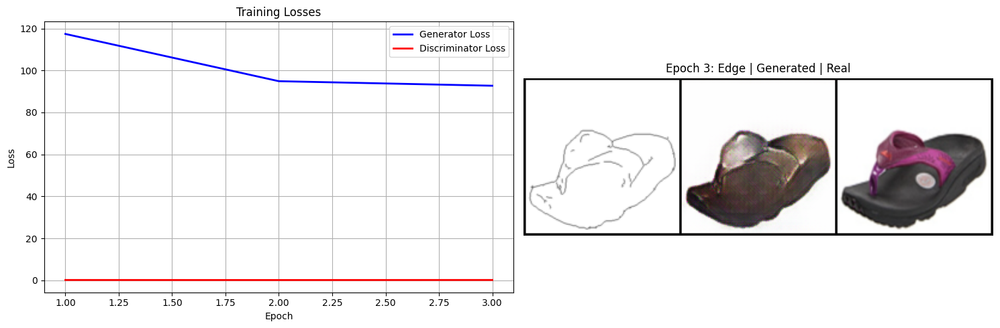

------------------------------------------------------------


Epoch 4/15: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=135.2916, D=0.0406, L1=0.3204, Perc=9.4776, LR=0.000159]


Epoch [4]: G_loss: 90.3572 | D_loss: 0.1737
  L1_loss: 0.1790 | Perceptual: 6.8751
  Learning Rate: 0.000159


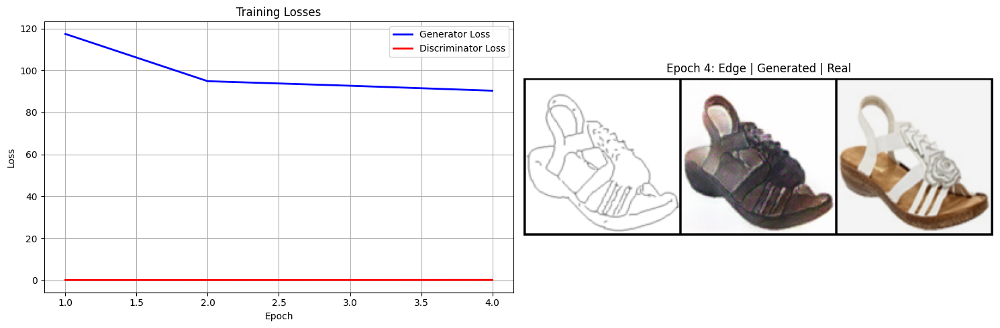

------------------------------------------------------------


Epoch 5/15: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=75.8883, D=3.0090, L1=0.1769, Perc=5.5018, LR=0.000131]


Epoch [5]: G_loss: 88.8101 | D_loss: 0.1848
  L1_loss: 0.1748 | Perceptual: 6.7810
  Learning Rate: 0.000131


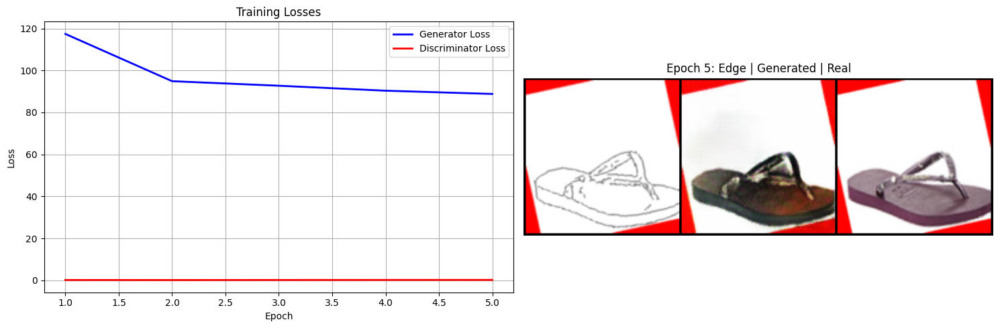

------------------------------------------------------------


Epoch 6/15: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=88.5166, D=1.9841, L1=0.1675, Perc=6.3860, LR=0.000101]


Epoch [6]: G_loss: 87.3286 | D_loss: 0.1816
  L1_loss: 0.1710 | Perceptual: 6.6903
  Learning Rate: 0.000101


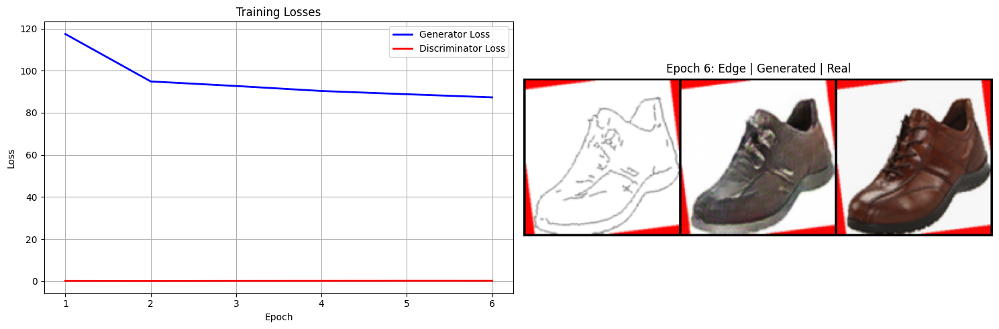

------------------------------------------------------------


Epoch 7/15: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=41.9925, D=4.5404, L1=0.0664, Perc=2.8525, LR=0.000070]


Epoch [7]: G_loss: 86.2306 | D_loss: 0.1821
  L1_loss: 0.1675 | Perceptual: 6.6394
  Learning Rate: 0.000070


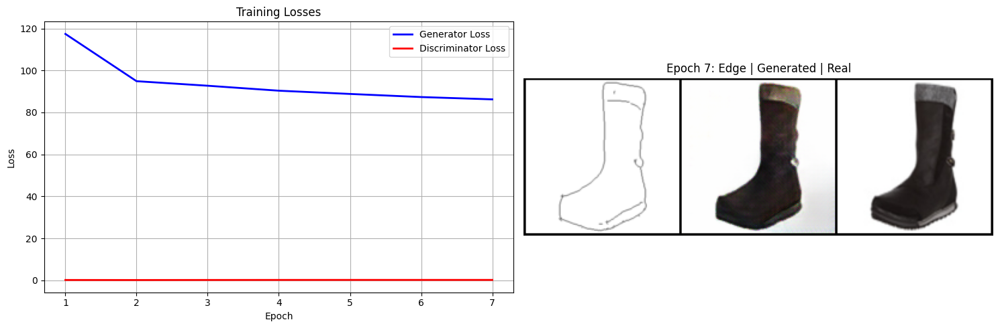

------------------------------------------------------------


Epoch 8/15: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=72.3031, D=4.2391, L1=0.1173, Perc=5.8380, LR=0.000042]


Epoch [8]: G_loss: 85.4941 | D_loss: 0.1763
  L1_loss: 0.1645 | Perceptual: 6.6107
  Learning Rate: 0.000042


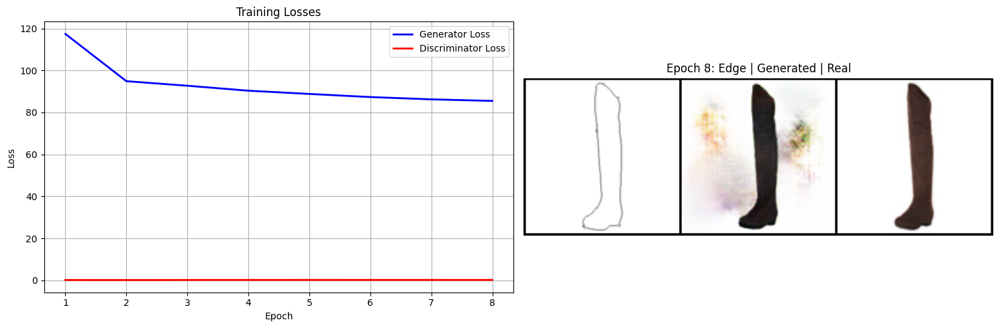

------------------------------------------------------------


Epoch 9/15: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=95.4819, D=0.7452, L1=0.2487, Perc=7.0114, LR=0.000020]


Epoch [9]: G_loss: 85.0239 | D_loss: 0.1686
  L1_loss: 0.1627 | Perceptual: 6.5977
  Learning Rate: 0.000020


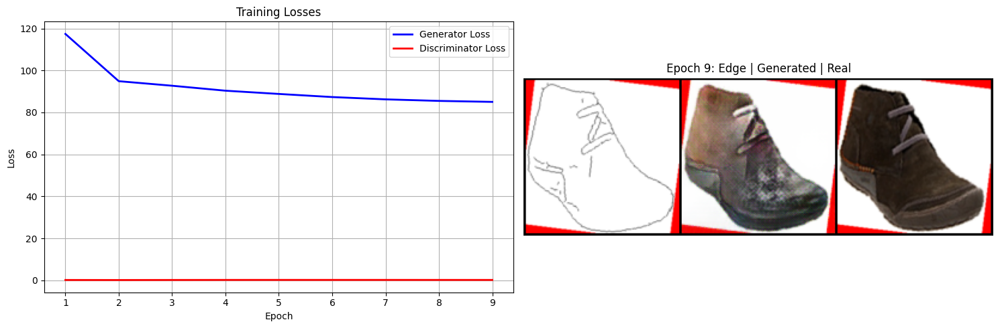

------------------------------------------------------------


Epoch 10/15: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=123.5621, D=3.1096, L1=0.3930, Perc=8.0652, LR=0.000006]


Epoch [10]: G_loss: 84.6396 | D_loss: 0.1736
  L1_loss: 0.1608 | Perceptual: 6.5950
  Learning Rate: 0.000006


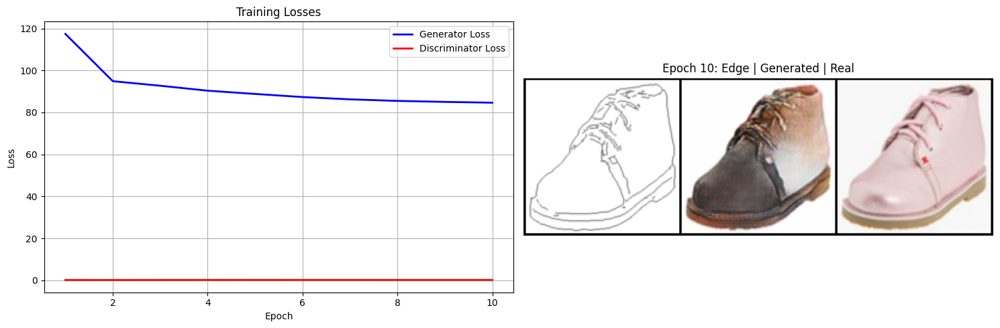

------------------------------------------------------------


Epoch 11/15: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=52.8200, D=4.6807, L1=0.0965, Perc=4.2180, LR=0.000001]


Epoch [11]: G_loss: 84.4681 | D_loss: 0.1615
  L1_loss: 0.1606 | Perceptual: 6.5837
  Learning Rate: 0.000001


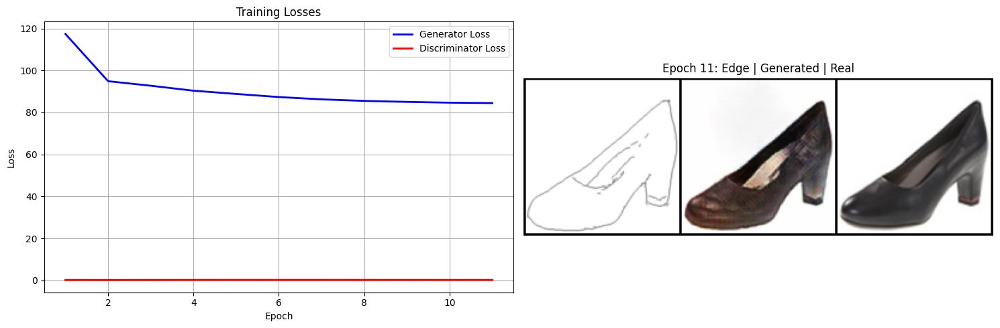

------------------------------------------------------------


Epoch 12/15: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=55.7358, D=1.3809, L1=0.1278, Perc=4.0253, LR=0.000006]


Epoch [12]: G_loss: 84.4710 | D_loss: 0.1725
  L1_loss: 0.1603 | Perceptual: 6.5843
  Learning Rate: 0.000006


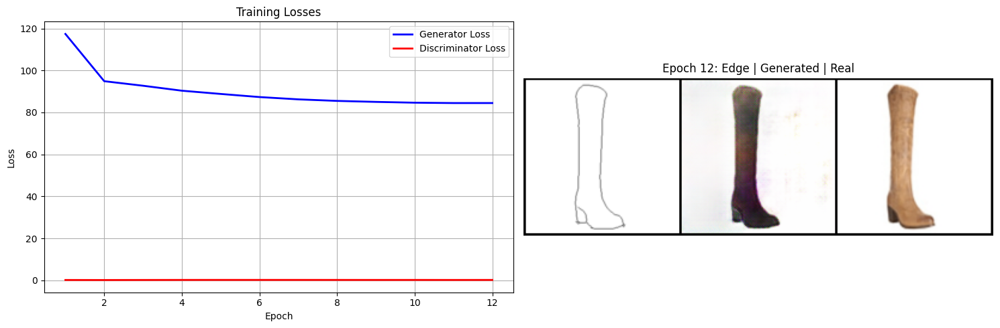

------------------------------------------------------------


Epoch 13/15: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=84.6141, D=1.7062, L1=0.1417, Perc=6.9573, LR=0.000020]


Epoch [13]: G_loss: 84.5701 | D_loss: 0.1804
  L1_loss: 0.1602 | Perceptual: 6.5803
  Learning Rate: 0.000020


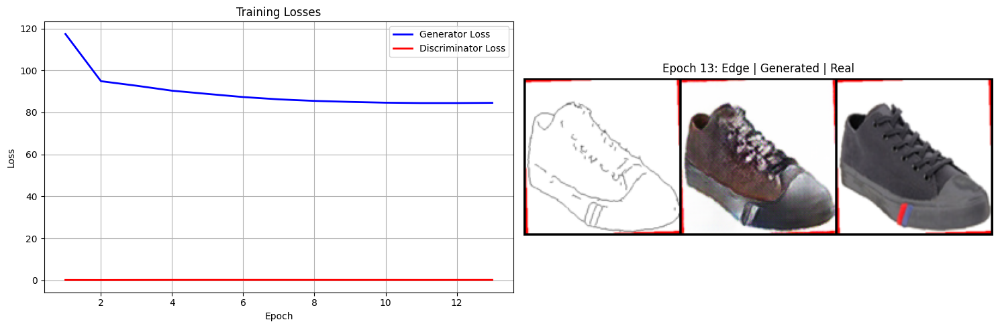

------------------------------------------------------------


Epoch 14/15: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=74.1316, D=5.2504, L1=0.2046, Perc=4.8828, LR=0.000042]


Epoch [14]: G_loss: 84.6119 | D_loss: 0.1969
  L1_loss: 0.1602 | Perceptual: 6.5607
  Learning Rate: 0.000042


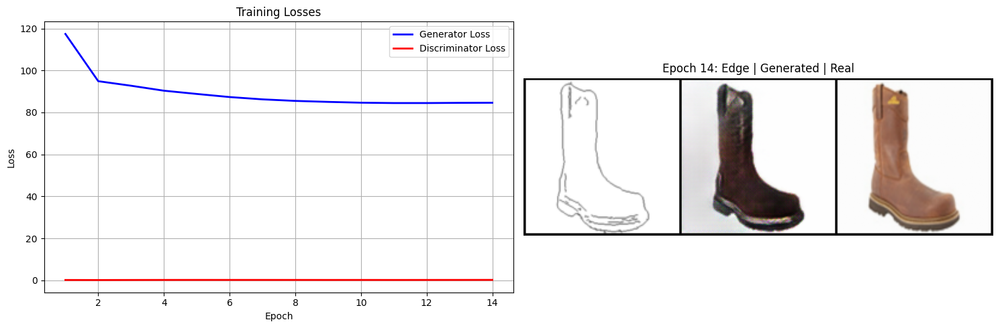

------------------------------------------------------------


Epoch 15/15: 100%|██████████| 1558/1558 [04:09<00:00,  6.25it/s, G=77.8737, D=1.7015, L1=0.1216, Perc=5.9793, LR=0.000070]


Epoch [15]: G_loss: 84.2808 | D_loss: 0.2063
  L1_loss: 0.1594 | Perceptual: 6.5140
  Learning Rate: 0.000070


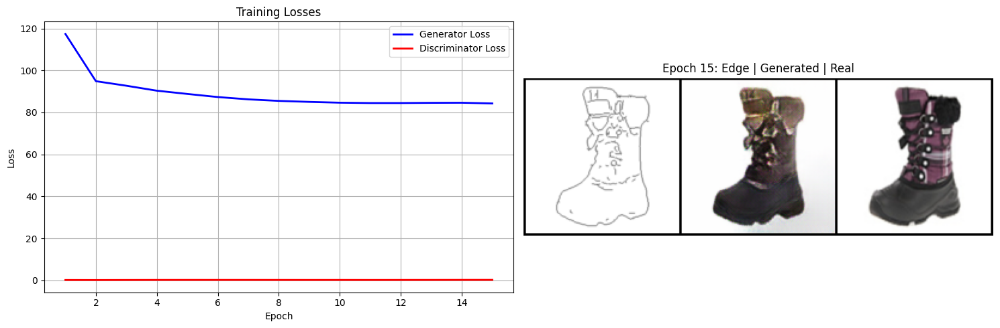

------------------------------------------------------------


([117.40026646860144,
  94.88606723496483,
  92.72212225604271,
  90.35717290111928,
  88.81005800122321,
  87.3286431916106,
  86.23060168167135,
  85.49408806640469,
  85.02387800449279,
  84.63955482316415,
  84.46810016705534,
  84.47103374025788,
  84.5701126323891,
  84.61185888699298,
  84.28076528370457],
 [0.1477675629306974,
  0.12768969740222455,
  0.1539339959429845,
  0.17367564498184462,
  0.18481321861448582,
  0.1816251367848816,
  0.18207263384093272,
  0.17629856950171838,
  0.1685809973843721,
  0.17358214587071225,
  0.1615296670281124,
  0.17254646806063104,
  0.18037530321828704,
  0.19689684038066016,
  0.20631573121801655],
 [0.2684638962646963,
  0.1914379913575077,
  0.18463424820840282,
  0.1790260815651028,
  0.1747842212141861,
  0.17101984506470555,
  0.16750677149451132,
  0.1645342970795365,
  0.1627041661731698,
  0.16077655399832708,
  0.16059570598854792,
  0.16031323928524654,
  0.16024908777302435,
  0.16017430973871682,
  0.15942616650263214],
 [8.

In [ ]:
# Phase 2: Switch to augmented dataset and continue training for another 5 epochs
print("\nPhase 2: Switching to Augmented Dataset")

# 1. Re-initialize your models to create fresh instances
print("Initializing new models for a fresh training session...")
generator = Generator(in_channels=3, out_channels=3).to(device)
discriminator = Discriminator(in_channels=6).to(device)

# 2. Re-initialize your optimizers to link them to the new models
print("Initializing new optimizers...")
optimizer_G = optim.Adam(generator.parameters(), lr=LEARNING_RATE, betas=(BETA1, BETA2))
optimizer_D = optim.Adam(discriminator.parameters(), lr=LEARNING_RATE, betas=(BETA1, BETA2))

# 3. Re-initialize your schedulers
scheduler_G = CosineAnnealingLR(optimizer_G, T_max=10, eta_min=1e-6)
scheduler_D = CosineAnnealingLR(optimizer_D, T_max=10, eta_min=1e-6)

# 4. Clear your tracking lists (your code already does this)
print("Clearing loss history...")
G_losses = []
D_losses = []
L1_losses = []
Perceptual_losses = []
learning_rates = []
epoch_images = []

NUM_EPOCHS = 15
train_model(train_loader_aug, start_epoch=0)  # Continue epoch numbering

Generating validation results...


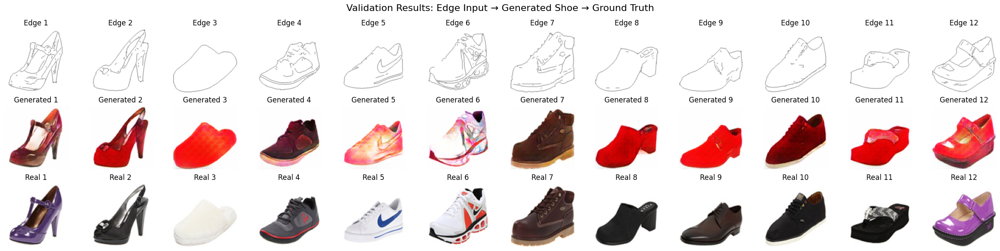

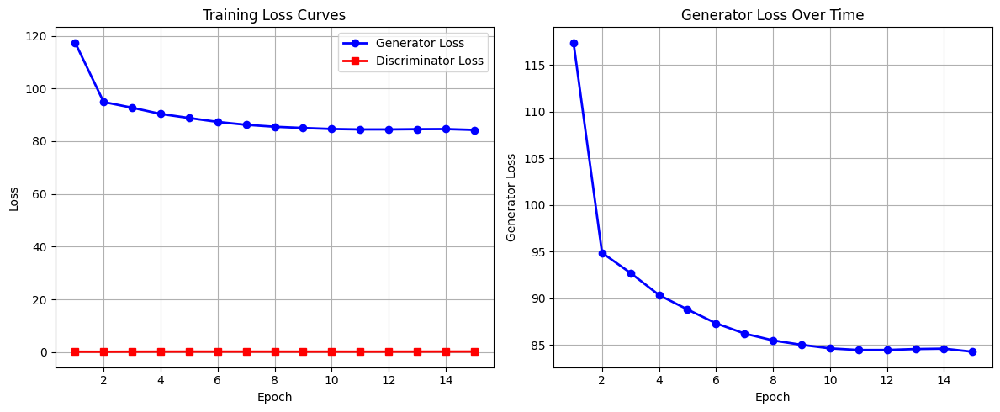


Training Progression:


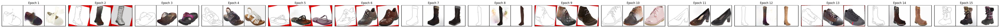

In [ ]:
# Set models to evaluation mode
generator.eval()
discriminator.eval()

def create_comparison_grid(val_loader, num_samples=10):
    """Create a comprehensive comparison grid"""
    generator.eval()

    edges_all = []
    reals_all = []
    fakes_all = []

    with torch.no_grad():
        for edge_imgs, real_shoes in val_loader:
            edge_imgs = edge_imgs.to(device)
            fake_shoes = generator(edge_imgs)

            edges_all.append(edge_imgs.cpu())
            reals_all.append(real_shoes.cpu())
            fakes_all.append(fake_shoes.cpu())

            if len(edges_all) * BATCH_SIZE >= num_samples:
                break

    # Concatenate all batches
    edges_all = torch.cat(edges_all, dim=0)[:num_samples]
    reals_all = torch.cat(reals_all, dim=0)[:num_samples]
    fakes_all = torch.cat(fakes_all, dim=0)[:num_samples]

    return edges_all, fakes_all, reals_all

# Generate validation results
print("Generating validation results...")
edges, fakes, reals = create_comparison_grid(val_loader, 12)

# Create detailed visualization
fig, axes = plt.subplots(3, 12, figsize=(24, 6))
fig.suptitle('Validation Results: Edge Input → Generated Shoe → Ground Truth', fontsize=16)

for i in range(12):
    # Denormalize images
    edge_img = denormalize(edges[i]).permute(1, 2, 0).numpy()
    fake_img = denormalize(fakes[i]).permute(1, 2, 0).numpy()
    real_img = denormalize(reals[i]).permute(1, 2, 0).numpy()

    # Edge input
    axes[0, i].imshow(edge_img)
    axes[0, i].set_title(f'Edge {i+1}')
    axes[0, i].axis('off')

    # Generated shoe
    axes[1, i].imshow(fake_img)
    axes[1, i].set_title(f'Generated {i+1}')
    axes[1, i].axis('off')

    # Real shoe
    axes[2, i].imshow(real_img)
    axes[2, i].set_title(f'Real {i+1}')
    axes[2, i].axis('off')

plt.tight_layout()
plt.show()

# Plot final training curves
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(range(1, len(G_losses)+1), G_losses, 'b-', label='Generator Loss', linewidth=2, marker='o')
plt.plot(range(1, len(D_losses)+1), D_losses, 'r-', label='Discriminator Loss', linewidth=2, marker='s')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Curves')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(range(1, len(G_losses)+1), G_losses, 'b-', linewidth=2, marker='o')
plt.xlabel('Epoch')
plt.ylabel('Generator Loss')
plt.title('Generator Loss Over Time')
plt.grid(True)

plt.tight_layout()
plt.show()

# Display training progression
print("\nTraining Progression:")
fig, axes = plt.subplots(1, len(epoch_images), figsize=(4*len(epoch_images), 4))
if len(epoch_images) == 1:
    axes = [axes]

for i in range(len(epoch_images)):
    axes[i].imshow(epoch_images[i].cpu().permute(1, 2, 0))
    axes[i].set_title(f'Epoch {i+1}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

In the case where data augmentation is applied, the red border from the data augmentation is most likely the reason why the generated shoes are red. The model  learned that when an image is rotated, red pixels appear. The reconstruction losses (L1 and Perceptual) force the generator to replicate everything in the "Real" target image, including the red padding pixels.
to fix it, I need to fix the data augmentation code. I would need to set the fill parameter in the rotation function to (1,1,1).

However, with data augmentation the artifacts in the background disappeared. That might be because while before the normalization was failing in evaluation mode, now data augmentation acted as a regularizer, forcing generalization.


## 📝 Evaluation Criteria

Your homework will be evaluated based on:

1. **Implementation Correctness (40%)**
   - Proper U-Net generator implementation
   - Correct PatchGAN discriminator
   - Working training loop with appropriate losses

2. **Training and Results (30%)**
   - Model trains without errors
   - Reasonable loss convergence
   - Generated images show edge-to-shoe translation

3. **Code Quality (20%)**
   - Clean, readable code with comments
   - Proper tensor shapes and data flow
   - Efficient implementation

4. **Analysis (10%)**
   - Discussion of results
   - Understanding of model behavior
   - Insights about GAN training